## Sky Map Generation

This notebook will serve as an introduction to everything related to the $\textit{mapmaking}$ process. $\textit{Mapmaking}$ is the creation of sky maps, particularly of the Cosmic Microwave Background (CMB). The photons that arrive at our instrument are translated into a raw signal, which we call $\textit{raw data}$. This is organized chronologically for each measurement; in other words, we have Time-Ordered Data (TOD). 

After a preprocessing of the TOD—where glitches like cosmic rays and detector-related issues (among others) are extracted—the mapmaking process is carried out, which can be parameterized by the following equation:

$$ d_i = P_{ij}s_j + \eta_i $$

The vector $d_i$ represents what we measure (i.e., the TOD), which is a column vector containing all the samples. The matrix $P_{ij}$ is commonly called the pointing matrix (or acquisition matrix), and it represents how the data depends on the model. Finally, the vector $\eta_i$ is the particular realization of the noise in each measurement (it can include instrumental noise from the detectors and noise from the incoming radiation).

We will assume the simplest possible model where we can estimate the map as $\tilde{\mathbf{s}} = \mathbf{W}\mathbf{d}$, where $\mathbf{W}$ is an $i \times j$ matrix that 
solve the linear method that you want. For estimate the the magnitude of the estimation error of each method, we "weights" by a matrix $\textbf{M}$ in the following equation:

$$ \mathbf{J} = (\mathbf{d} - \mathbf{P}\tilde{\mathbf{s}})^T \mathbf{M} (\mathbf{d} - \mathbf{P}\tilde{\mathbf{s}}) $$

where $\mathbf{J}$ represents the error of our linear estimation of $\tilde{\mathbf{s}}$. For example, in the simplest case where all our measurements are independent and have the same noise level, we will have $\mathbf{M} = \mathbb{I}$; this case is called $\textbf{binned mapmaking}$. Another method mostly used is the $\textbf{maximum likelihood}$ where we take in account the noise correlations in our data, in this case, we took, $\textbf{M} = \textbf{{N}}^{-1}$, where $\textbf{{N}} = \langle \boldsymbol{\eta} \boldsymbol{\eta}^T\rangle $ is the noise covariance matrix and without loss of generality $\langle \boldsymbol{\eta} \rangle = 0$.


To find the matrix $\textbf{W}$ we minimize $\textbf{J}$ respect to the estimator $\tilde{\textbf{s}}$ and we get:

$$ \mathbf{W} = (\mathbf{P}^T \mathbf{M} \mathbf{P})^{-1} \mathbf{P}^T \mathbf{M} $$

So for the case of the $\textbf{binned mapmaking}$ we get $\mathbf{W} = (\mathbf{P}^T\mathbf{P})^{-1} \mathbf{P}^T$ and for the case of $\textbf{maximum likelihood}$ we get $\mathbf{W} = (\mathbf{P}^T \mathbf{N}^{-1} \mathbf{P})^{-1} \mathbf{P}^T \mathbf{N}^{-1}$

Now we want to apply these methods and see what we get. First we want to get a signal of the CMB, for these we work with $\textbf{CAMB}$ and create a cosmology:

In [29]:
# libreries
import healpy as hp
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import os
from astropy.io import fits
from astropy.table import Table
import camb
from camb import model, initialpower
from sotodlib import io

In [30]:
# first we generate our input map with only the CMB signal 
#Set up a new set of parameters for CAMB
#The defaults give one massive neutrino and helium set using BBN consistency
pars = camb.set_params(H0=67.5, ombh2=0.022, omch2=0.122, mnu=0.06, omk=0, tau=0.06,  
                       As=2e-9, ns=0.965, halofit_version='mead', lmax=5000)
pars.set_for_lmax(5000, lens_potential_accuracy=2)
pars.WantTensors = True

#calculate results for these parameters
results = camb.get_results(pars)

## now add tensors keeping at r = 0.008  ## note we can recompute the tenser contribution with out rerunning the scalar part.
inflation_params = initialpower.InitialPowerLaw()
inflation_params.set_params(ns=0.96, r=0.008)

results.power_spectra_from_transfer(inflation_params) #warning OK here, not changing scalars
lmax=5000

## get the Dl's
dls = results.get_total_cls(lmax, CMB_unit='muK') 

ell_and_cell = np.append(np.arange(np.size(dls[:,0])), dls.transpose().ravel())
ell_and_cell = ell_and_cell.reshape((5,5001))

# now we get the dl's

ells = ell_and_cell[0]
DlTT = ell_and_cell[1]
DlEE = ell_and_cell[2]
DlBB = ell_and_cell[3]
DlTE = ell_and_cell[4]

# given the cosmology, we simulate a map with synfast
nside = 1024
simulated_map = hp.synfast([DlTT, DlEE, DlBB, DlTE], nside=nside, new=1)

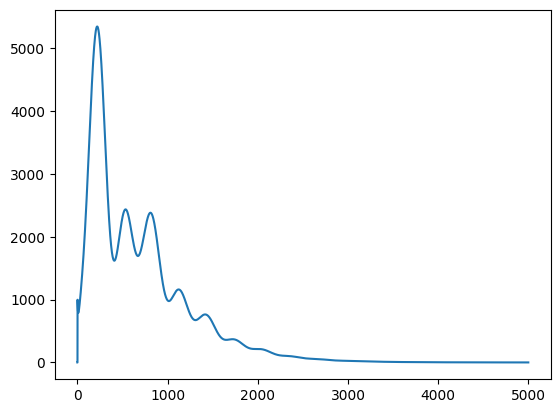

In [31]:
plt.plot(ells,DlTT, label='TT')

In a first view, we want to work in a flat aproximation, so for now, we will create maps for ''flat CMB''. 

Since the power spectrum is a function of $\ell$, tipically, we work in harmonic space if we are planning to generate a full sky map. Here we consider a small patch of sky ($ ~ 10° \times 10°$) where we can use the ''flat-sky'' approximation and replace $\ell$ with:

$$
k = \sqrt{k_x^2 + k_y^2}

$$

There is a linear depende between these variables defined by $\ell = k * 2\pi$. So in this approximation we:

* Generate a $2D$ power spectrum by revolving the above spectrum (properly normalizaed) about the axis in polar coordinates
* Generate a Gaussian random map with unit variance as our ''random realization''
* Multiplying that maps from the points above
* Fourier transforming this to get a real space map 


(1024, 1024)
map mean: 1.5265566588595902e-15 map rms: 102.25601574554096


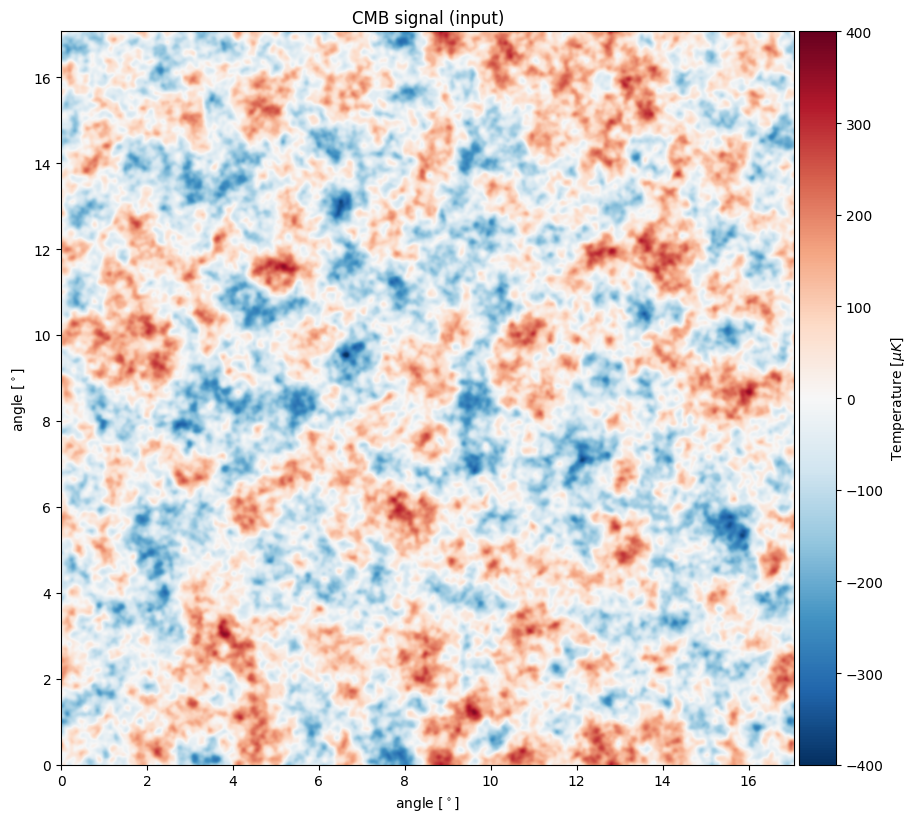

In [32]:
def make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB):
    "makes a realization of a simulated CMB sky map"

    # convert Dl to Cl, we use np.divide to avoid dividing by zero.
    dell = ell * (ell + 1) / 2 / np.pi
    ClTT = np.divide(DlTT, dell, where=ell>1)
    ClEE = np.divide(DlEE, dell, where=ell>1)
    ClTE = np.divide(DlTE, dell, where=ell>1)
    ClBB = np.divide(DlBB, dell, where=ell>1)
    
    # set the \ell = 0 and \ell =1 modes to zero as these are unmeasurmable and blow up with the above transform
    ClTT[0:2] = 0.
    ClEE[0:2] = 0.
    ClTE[0:2] = 0.
    ClBB[0:2] = 0.

    # separate the correlated and uncorrelated part of the EE spectrum
    #correlated_part_of_E = np.divide(ClTE, np.sqrt(ClTT), where=ell>1) # creo que esto está mal, lo checkeare despúes de correr el código
    correlated_part_of_E = np.divide(ClTE**2, ClTT, where=ell>1)
    uncorrelated_part_of_EE = ClEE - np.divide(ClTE**2., ClTT, where=ell>1)
    
    correlated_part_of_E[0:2] = 0.
    uncorrelated_part_of_EE[0:2] = 0.
    
    # make a 2d coordinate system
    ones = np.ones(N)
    inds  = (np.arange(N) - N/2.) /(N-1.)
    X = np.outer(ones,inds) # producto matricial
    Y = np.transpose(X)
    
    #this will be our k
    R = np.sqrt(X**2. + Y**2.)

    ang = np.arctan2(Y,X)   ## we now need this angle to handle the EB <--> QU rotation
    
    # now make a set of 2d CMB masks for the T, E, and B maps
    ell_scale_factor = 2. * np.pi / (pix_size/60. * np.pi/180.) #pixs to grads
    ell2d = R * ell_scale_factor # ell = k /2 pi 
    print(np.shape(ell2d))
   
    ClTT_expanded = np.zeros(int(ell2d.max())+1)
    ClTT_expanded[0:(ClTT.size)] = ClTT # apply the ''old'' over the Cl until a new ''Cl'' given by the len of the space of k
    
    ClEE_uncor_expanded = np.zeros(int(ell2d.max())+1)
    ClEE_uncor_expanded[0:(uncorrelated_part_of_EE.size)] = uncorrelated_part_of_EE
    ClE_corr_expanded = np.zeros(int(ell2d.max())+1)
    ClE_corr_expanded[0:(correlated_part_of_E.size)] = correlated_part_of_E
    
    ClBB_expanded = np.zeros(int(ell2d.max())+1)
    #ClBB_expanded = np.outer(ones,inds) # producto matricial
    #this will be oeros(int(ell2d.max())+1)
    ClBB_expanded[0:(ClBB.size)] = ClBB
    CLTT2d = ClTT_expanded[ell2d.astype(int)]
    ClEE_uncor_2d = ClEE_uncor_expanded[ell2d.astype(int)]
    ClE_corr2d = ClE_corr_expanded[ell2d.astype(int)]
    CLBB2d = ClBB_expanded[ell2d.astype(int)]
    
    # now make a set of gaussian random fields that will be turned into the CMB maps
    randomn_array_for_T = np.fft.fft2(np.random.normal(0,1,(N,N)))
    randomn_array_for_E = np.fft.fft2(np.random.normal(0,1,(N,N))) 
    randomn_array_for_B = np.fft.fft2(np.random.normal(0,1,(N,N))) 
    
    ## make the T, E, and B maps by multiplying the masks against the random fields
    FT_2d = np.sqrt(CLTT2d) * randomn_array_for_T
    #FE_2d = np.sqrt(ClEE_uncor_2d) * randomn_array_for_E + ClE_corr2d* randomn_array_for_T #aquí faltaría un np.sqrt ?
    FE_2d = np.sqrt(ClEE_uncor_2d) * randomn_array_for_E + np.sqrt(ClE_corr2d) * randomn_array_for_T
    FB_2d = np.sqrt(CLBB2d) * randomn_array_for_B
    
    ## now conver E abd B to Q and U
    FQ_2d = FE_2d* np.cos(2.*ang) - FB_2d * np.sin(2. *ang)
    FU_2d = FE_2d* np.sin(2.*ang) + FB_2d * np.cos(2. *ang)
    
    ## convert from fourier space to real space
    CMB_T = np.fft.ifft2(np.fft.fftshift(FT_2d)) /(pix_size /60.* np.pi/180.)
    CMB_T = np.real(CMB_T)
    CMB_Q = np.fft.ifft2(np.fft.fftshift(FQ_2d)) /(pix_size /60.* np.pi/180.)
    CMB_Q = np.real(CMB_Q)
    CMB_U = np.fft.ifft2(np.fft.fftshift(FU_2d)) /(pix_size /60.* np.pi/180.)
    CMB_U = np.real(CMB_U)

    ## optional code for spitting out E and B maps 
    CMB_E = np.fft.ifft2(np.fft.fftshift(FE_2d)) /(pix_size /60.* np.pi/180.)
    CMB_E = np.real(CMB_E)
    CMB_B = np.fft.ifft2(np.fft.fftshift(FB_2d)) /(pix_size /60.* np.pi/180.)
    CMB_B = np.real(CMB_B)
    
    ## return the maps
    return(CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B)
  ###############################

def Plot_CMB_Map(Map_to_Plot, c_min, c_max, X_width, Y_width, set_lims = 0):
    from mpl_toolkits.axes_grid1 import make_axes_locatable

    print("map mean:", np.mean(Map_to_Plot), "map rms:", np.std(Map_to_Plot))
    plt.gcf().set_size_inches(10, 10)
    im = plt.imshow(
        Map_to_Plot, interpolation="bilinear", origin="lower", cmap=cm.RdBu_r
    )

    plt.ylabel(r"angle $[^\circ]$")
    plt.xlabel(r"angle $[^\circ]$")
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax, label=r"Temperature $[ \mu K]$")

    if set_lims == 1:
        im.set_clim(c_min, c_max)
        im.set_extent([0, X_width, 0, Y_width])
        plt.show()

    else:        
        plt.show()

# some variables
N = 2**10 #number of pixels in a linear dimension (we stay in these number because we using lots of FFTs)
pix_size = 1 
CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B = make_CMB_maps(N ,pix_size,ells,DlTT,DlEE,DlTE,DlBB)

## variables to set up the map plots
c_min = -400  # minimum for color bar
c_max = 400   # maximum for color bar
X_width = N*pix_size/60.  # horizontal map width in degrees
Y_width = N*pix_size/60.  # vertical map width in degrees

plt.title('CMB signal (input)')
Plot_CMB_Map(CMB_T, c_min, c_max, X_width, Y_width, set_lims=1)

In [33]:
ones = np.ones(N)
inds  = (np.arange(N) - N/2.) /(N-1.)
X = np.outer(ones,inds)
Y = np.transpose(X)
    
#this will be our k
R = np.sqrt(X**2. + Y**2.)

ell_scale_factor = 2. * np.pi / (pix_size/60. * np.pi/180.) #pixs to grads
ell2d = R * ell_scale_factor

ClTT_expanded = np.zeros(int(ell2d.max())+1)
ClTT_expanded[0:(DlTT.size)] 

array([0., 0., 0., ..., 0., 0., 0.], shape=(5001,))

In [34]:
DlTT.shape

(5001,)

In [35]:
ClTT_expanded.shape

(15289,)

In [36]:
DlTT.shape

(5001,)

In [37]:
ClTT_expanded[0:(DlTT.size)] = DlTT

In [38]:
ClTT_expanded

array([  0.        ,   0.        , 998.62440192, ...,   0.        ,
         0.        ,   0.        ], shape=(15289,))

Now we want to generate a time-stream from thse simulated sky map. For these, we simulate the telescope scanning accross the map. For simplicity, we consider two scan directions: left-right and up-down. This code generates a list of pixels (x and y coordinates) in the order in which they are observerd.

array([[0, 1, 2, 3, 3, 2, 1, 0, 0, 1, 2, 3, 3, 2, 1, 0],
       [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3]])

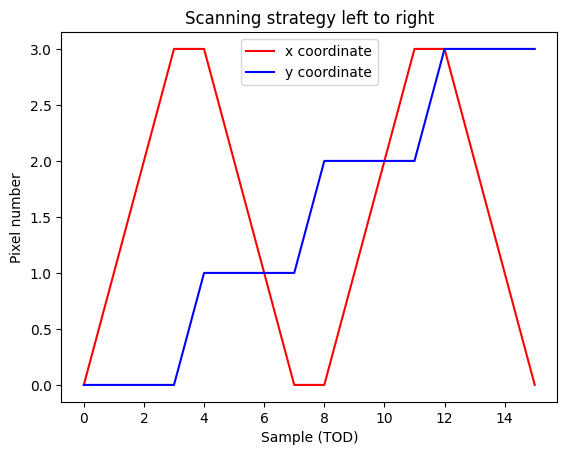

In [39]:
def sim_pointig(map, dir, det = (0,0)):
    # first, we want the len of each direction of the map 
    x_len = len(map[0, :])
    y_len = len(map[:, 0])

    # now we create a pixmap, for x and y coordinates
    # (1024 x 1024 matrix for each coordinate)
    # the y_coords gives us [0,0]
    #                       [1,1]
    # and x_coords give us [0,1]
    #                       [0,1]
    y_coords, x_coords = np.indices((x_len, y_len))

    # left to right scanning
    if dir == 0:
        # this says, take the x[i] coordinate and invert them
        # for example x[1] = [0 ,1 ,2 ]
        # and with this x[1] = [2, 1, 0]
        # we do it for the odd rows
        for i in range(1, y_len, 2):
            x_coords[i,:] = x_coords[i, ::-1]
             
    # now we "flat" the coordinates
    # for example if x_coords = [0,1,2]
    #                           [2,1,0]
    #                           [0,1,2]
    # the x_coords.flatten() = [0,0,0,1,1,1,2,2,2] 
        x_scan = x_coords.flatten()
        y_scan = y_coords.flatten()
    
    # up to down scanning
    if dir == 1:
        # the same thing, but we do it in the columns
        for i in range(1, x_len, 2):
            y_coords[:,i] = y_coords[::-1, i]
       
        x_scan = x_coords.flatten('F')
        y_scan = y_coords.flatten('F')

    pix_pat = np.array([y_scan, x_scan])
    if det[0] > 0:
        ndet = det[0]*det[1]
        detoffs = np.mgrid[:det[0],:det[1]].reshape(2,-1)
        pix_pat = pix_pat[:, None, :] + detoffs[:,:, None]

    pix_pat[0] %= y_len
    pix_pat[1] %= x_len

    return pix_pat

# a toy example:
point_lr_ex = sim_pointig(np.zeros([4,4]), 0)
point_ud_ex = sim_pointig(np.zeros([4,4]), 1)

plt.title('Scanning strategy left to right')
plt.xlabel('Sample (TOD)')
plt.ylabel('Pixel number')
plt.plot(point_lr_ex[1,:], c = 'red', label = 'x coordinate')
plt.plot(point_lr_ex[0,:], c = 'blue', label = 'y coordinate')
plt.legend()

point_ud_ex


Now we want to sample this pattern of observation in each pixel ouf four map, and create our TOD:

In [40]:
# for each pair of coordinates x-y on our pixels, we identify a value respectively with the temperature of the map
def Observe_map(map, point):
    """Pointing matrix: Project map to tod"""
    point = np.round(point).astype(int)

    #for example if point[0] = [0,1,2]
    #               point[1] = [0,0,0]
    # map[point[0], point[1]] = [map[0,0], map[1,0], map[2,0]]
    return map[point[0],point[1]]  ## return the value of the map at each pointing, this forms the simulated time stream

pointing_ltor = sim_pointig(CMB_T, 0)
pointing_utod = sim_pointig(CMB_T, 1)

cmb_tod_ltor = Observe_map(CMB_T, pointing_ltor)
cmb_tod_utod = Observe_map(CMB_T, pointing_utod)

len(cmb_tod_ltor)

1048576

RMS for left to right scanning: 102.25601574554096
RMS for up to down scanning 102.25601574554099


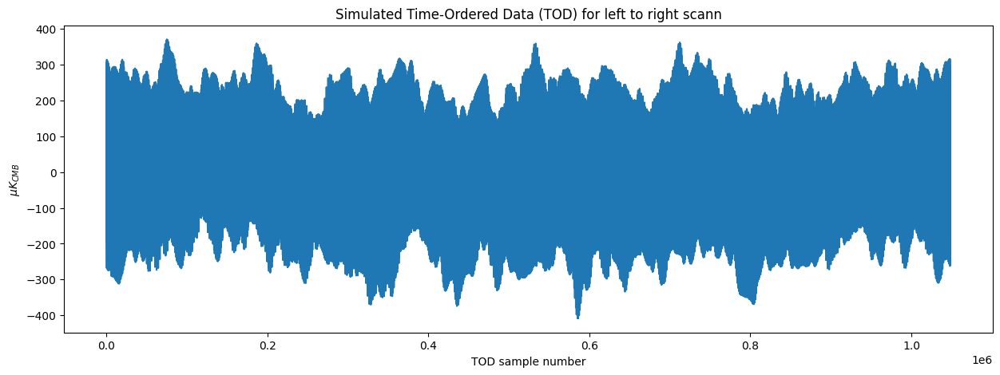

In [41]:
plt.figure(figsize=(15,5))

plt.plot(cmb_tod_ltor, label = 'Left-Right') 
#plt.plot(cmb_tod_utod, label = 'Up- Down')
plt.title("Simulated Time-Ordered Data (TOD) for left to right scann")
#plt.xlim(0, 10000)
plt.ylabel(r'$\mu K_{CMB}$')
plt.xlabel(r'TOD sample number')
#plt.legend()

print('RMS for left to right scanning:', np.sqrt(np.mean(cmb_tod_ltor**2)))
print('RMS for up to down scanning', np.sqrt(np.mean(cmb_tod_utod**2)))

Now we can add some noise to our time streams. For these, we need to build a noise power spectrum for the atmospheric and instrumental noise, for these we use the following:

$$
P(f) = \sigma^2 + \sigma^2 \left( \frac{f}{f_{knee}} \right)^{-\alpha}
$$

where:

* $\sigma ^2$ : Instrumental noise
* $f_{knee}$ : Knee frequency. This is the frequency where atmospherical noise is equal to Instrumental Noise.
* $\alpha$ : Spectral index. This tell us how fast get ''worse'' the noise when you do a ''low'' scanning at low frequencies.

Notice that the behavior of $1/f$ tell us that a lower frequencies, the atmospheric noise master the behavior.


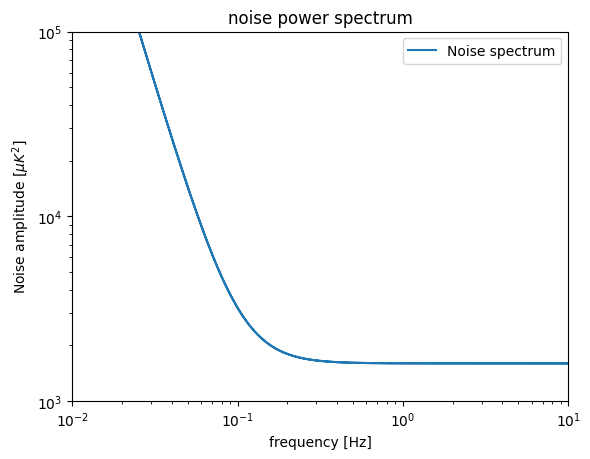

In [42]:
def sim_noise_spec(nsamp, dt=.00416, fknee=0.1, alpha=3, sigma=40):
    """Build a simple atmosphere + white noise model, and return it
    as a power spectrum."""
    # first we generate some frequencies
    freq   = np.abs(np.fft.fftfreq(nsamp, dt))
    
    # now we apply our model
    return freq, (1+(np.maximum(freq,freq[1])/fknee)**-alpha)*sigma**2


freq_lr, noise_spec_lr = sim_noise_spec(pointing_ltor.shape[-1], dt=.00416, fknee=0.1, alpha=3, sigma=40)
freq_ud, noise_spec_ud = sim_noise_spec(pointing_utod.shape[-1], dt=.00416, fknee=0.1, alpha=3, sigma=40)

plt.loglog(freq_lr,noise_spec_lr, label = 'Noise spectrum')
#plt.loglog(freq_ud,noise_spec_ud, label = 'Noise spectrum for U-D scanning', linestyle = 'dashed')
plt.title("noise power spectrum")
plt.xlabel("frequency [Hz]")
plt.ylabel(r"Noise amplitude $[\mu K^{2}]$")
plt.ylim(1e3,1e5)
plt.xlim(1e-2,10)
plt.legend()
plt.show()

Now we want to generate a realization of this noise and add it to noisless time series.

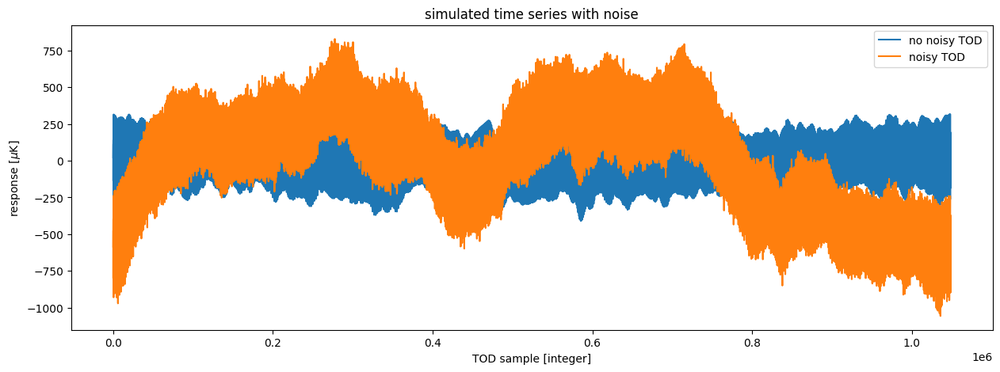

In [208]:
def sim_tod(map, point, noise_spec):
    """Simulate a noisy TOD using the model d = Pm + n"""
    tod    = Observe_map(map, point)
    
    # we generate a random realization of our TOD in fourier space
    rand   = np.fft.fft(np.random.standard_normal(tod.shape[-1]))

    fnoise = rand * noise_spec**0.5
    
    # we get back to real space
    tod   += np.fft.ifft(fnoise).real
    return tod



tod_lr = sim_tod(CMB_T, pointing_ltor, noise_spec_lr)
#tod_ud = sim_tod(CMB_T, pointing_utod, noise_spec_ud)

plt.figure(figsize=(15,5))

plt.plot(cmb_tod_ltor, label = 'no noisy TOD')
plt.plot(tod_lr, label = 'noisy TOD')
#plt.plot(tod_ud)
plt.title("simulated time series with noise")
plt.ylabel("response [$\mu$K]")
plt.xlabel("TOD sample [integer]")
plt.legend()
plt.show()

In [44]:
noise_spec_lr.shape

(1048576,)

In [ ]:
#first we define a class, which cointains the TOD,the pointing strategy and also can include some noise (not already implemented)
def sim_dataset(map, num_data=2,noise=0, dt=.00416, fknee=0.1, alpha=3, sigma=40):
    """Simulate a dataset consisting of num_data scans across the sky.
    Returns a list of Data objects, each of which contains the tod,
    the pointing and the noise spectrum."""
    res = []
    for i in range(num_data):
        point = sim_pointig(map, i % 2)
        if noise == 1:
            freq, noise_spec = sim_noise_spec(point.shape[-1], dt=dt, fknee=fknee, alpha=alpha, sigma=sigma)
            tod = sim_tod(map, point, noise_spec)
            res.append(Data(tod, point, noise_spec))
            res.append(freq)
        else:
            tod = Observe_map(map, point)
            res.append(Data(tod, point, None))
    return res


class Data:
    def __init__(self, tod, point, noise_spec):
        self.tod   = tod
        self.point = point
        self.noise_spec = noise_spec


print("Generating noisy TOD simulations")
dataset  = sim_dataset(CMB_T,num_data=2,noise=0)# dt=.00416, fknee=0.1, alpha=3, sigma=40)
noisy_dataset = sim_dataset(CMB_T,num_data=2,noise=1, dt=.00416, fknee=0.3, alpha=3, sigma=40)



Generating noisy TOD simulations


In [190]:
class Data:
    def __init__(self, tod, point, noise_spec, freq=None):
        self.tod   = tod
        self.point = point
        self.noise_spec = noise_spec
        self.freq = freq # Lo guardamos como un atributo

def sim_dataset(map, num_data=2,noise=0, dt=.00416, fknee=0.1, alpha=3, sigma=40):
    res = []
    for i in range(num_data):
        point = sim_pointig(map, i % 2)
        if noise == 1:
            freq, noise_spec = sim_noise_spec(point.shape[-1], dt=dt, fknee=fknee, alpha=alpha, sigma=sigma)
            tod = sim_tod(map, point, noise_spec)
            # Pasamos freq al objeto Data
            res.append(Data(tod, point, noise_spec, freq)) 
        else:
            tod = Observe_map(map, point)
            res.append(Data(tod, point, None))
    return res

print("Generating noisy TOD simulations")
dataset  = sim_dataset(CMB_T,num_data=2,noise=0)# dt=.00416, fknee=0.1, alpha=3, sigma=40)
noisy_dataset = sim_dataset(CMB_T,num_data=2,noise=1, dt=.00416, fknee=0.3, alpha=3, sigma=40)



Generating noisy TOD simulations


IndexError: list index out of range

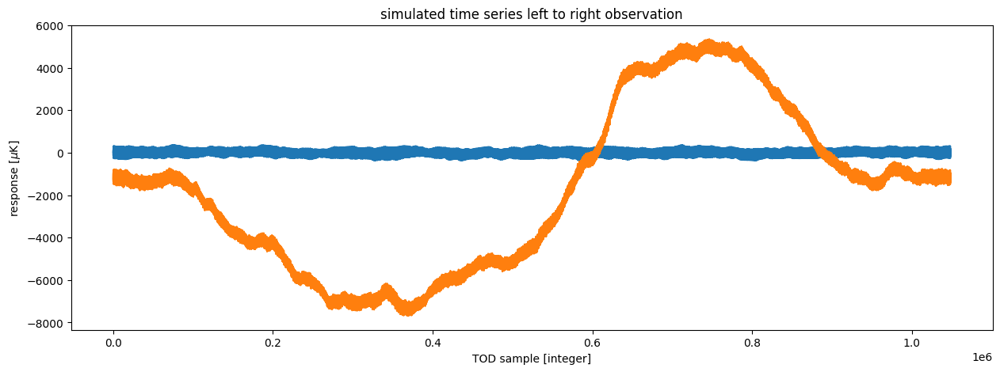

In [204]:
plt.figure(figsize=(15,5))
plt.plot(dataset[0].tod, label='clean tod' )
plt.plot(noisy_dataset[0].tod, label = 'noisy tod')
plt.title("simulated time series left to right observation")
plt.ylabel("response [$\mu$K]")
plt.xlabel("TOD sample [integer]")
plt.show()

In [193]:
## make an array to represent the frequency
delta_t = (dataset[0].tod[1]-dataset[0].tod[0]).real  ## the step size for the t grid
freq_nyquist = 1/delta_t/2.
print("Nyquist frequency: ", freq_nyquist)

freq = np.roll(np.linspace(-1,1,len(dataset[0].tod)),int(len(dataset[0].tod/2)))


Nyquist frequency:  0.0427114092051951


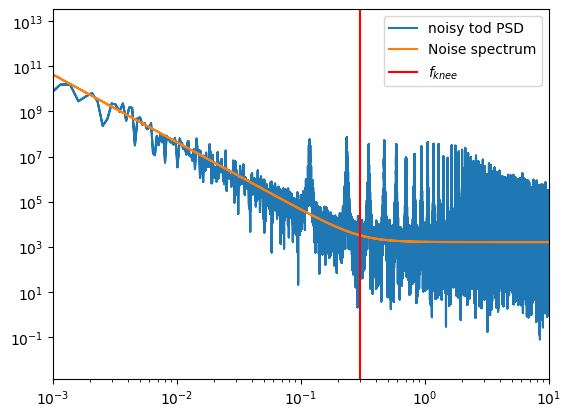

In [205]:
#plt.loglog(np.abs(np.fft.rfft(dataset[0].tod))**2, label='clean tod' )
plt.loglog(noisy_dataset[0].freq, (np.abs(np.fft.fft(noisy_dataset[0].tod))**2)/len(noisy_dataset[0].tod), label = 'noisy tod PSD')
plt.loglog( noisy_dataset[0].freq, noisy_dataset[0].noise_spec, label = 'Noise spectrum')
plt.axvline(0.3, color='red', label=r'$f_{knee}$')
#plt.plot
plt.plot()
#plt.ylim(1e3,1e5)
plt.xlim(1e-3,10)
plt.legend()

As I mentioned before, the simplest way to do the mapmaking process is doing a $\textbf{binned mapmaking}$. The idea is simple, we want to count how many times each pixel has been seen by our observation, and then take the average (you can see this, for example, in a hitmap).
For this, remember that the $\textbf{Pointing Matrix}$ contains information about the pixels you see (columns) and the sample or time you saw that pixel (rows). Suppose that we had 4 samples and we saw the pixel's $(0,0), (0,1), (1,1), (1,0)$ then $\textbf{P}$ will be:


$$
\mathbf{P} = \begin{pmatrix}
1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\
0 & 0 & 0 & 1 \\
0 & 0 & 1 & 0
\end{pmatrix}
$$

if we transpose this matrix and multiply by the TOD, we simply get:

$$\mathbf{P}^T \mathbf{d} = 
\begin{pmatrix}
1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\
0 & 0 & 0 & 1 \\
0 & 0 & 1 & 0
\end{pmatrix}
\begin{pmatrix}
T_1 \\
T_2 \\
T_3 \\
T_4
\end{pmatrix}
=
\begin{pmatrix}
T_1 \\
T_2 \\
T_4 \\
T_3
\end{pmatrix}
$$

As you can see this operation is telling me which values of temperature I have in each pixel. Then following with the another matrix's :

$$
\mathbf{P}^T \mathbf{P} = \begin{pmatrix}
1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\
0 & 0 & 1 & 0 \\
0 & 0 & 0 & 1
\end{pmatrix}
$$

And this simply says how many times I see that pixel given my samples (in this case, we only have once each pixel). The we can get our matrix $\mathbf{W} = (\mathbf{P}^T\mathbf{P})^{-1} \mathbf{P}^T$ times the TOD which is our estimator for the map:


$$\tilde{\mathbf{s}} = (\mathbf{P}^T \mathbf{P})^{-1} \mathbf{P}^T \mathbf{d} =
\begin{pmatrix}
1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\
0 & 0 & 1 & 0 \\
0 & 0 & 0 & 1
\end{pmatrix}
\begin{pmatrix}
T_1 \\
T_2 \\
T_4 \\
T_3
\end{pmatrix}
=
\begin{pmatrix}
T_1 \\
T_2 \\
T_4 \\
T_3
\end{pmatrix}
$$




map mean: 1.5265566588595902e-15 map rms: 102.25601574554096


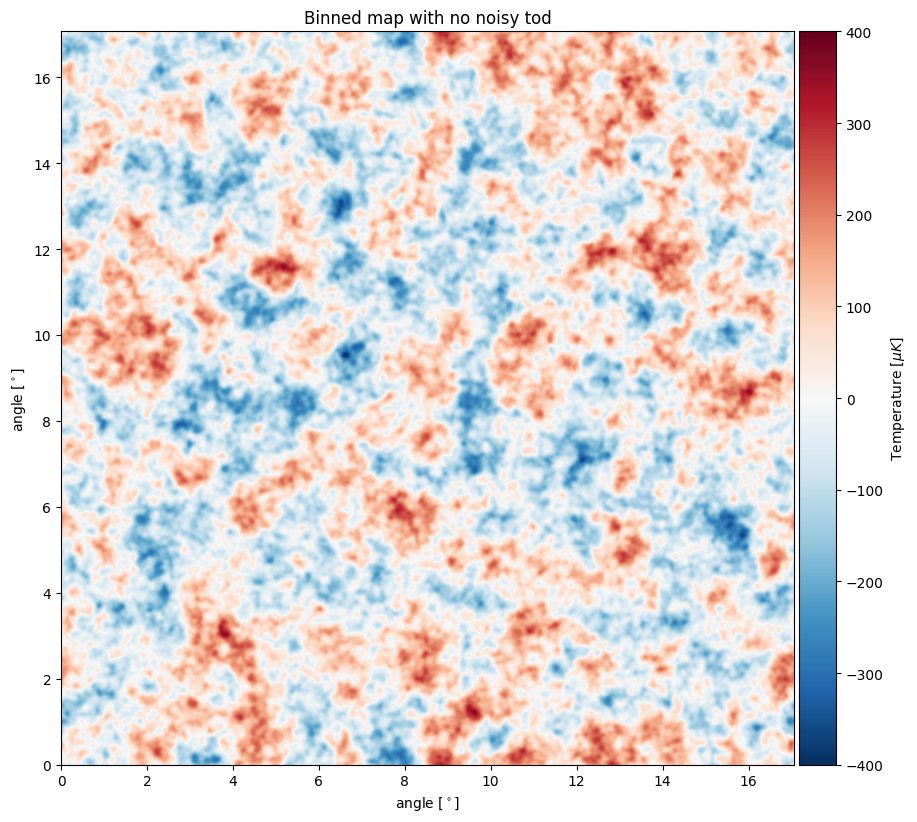

map mean: 0.0 map rms: 0.0


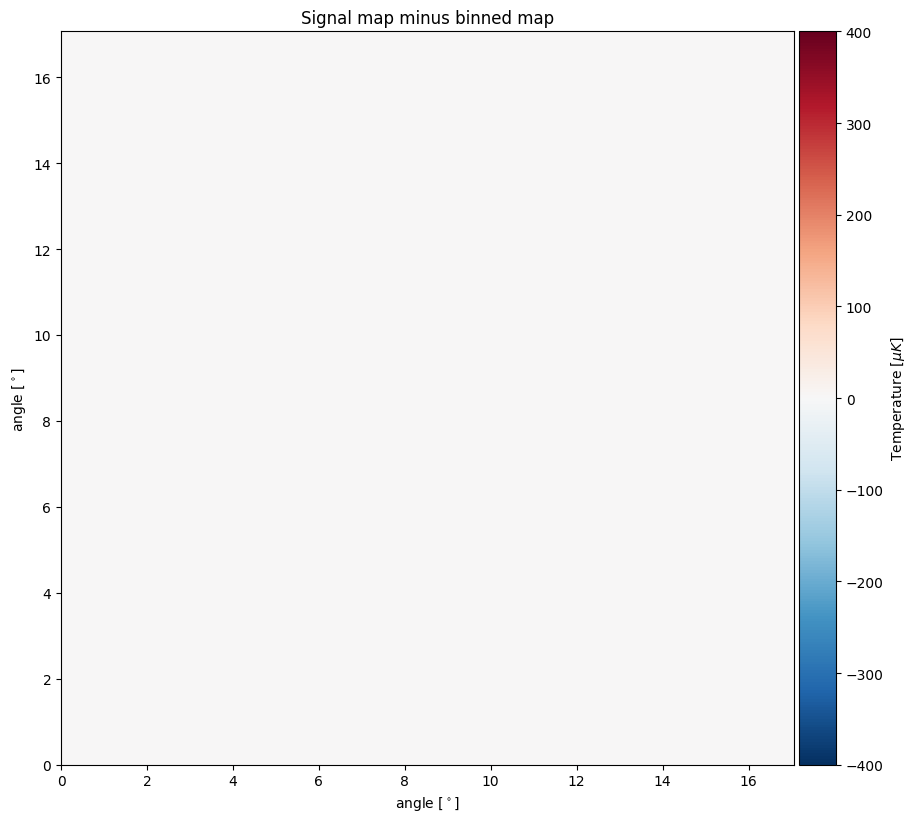

In [209]:
# first, we want to create the tranpose of the pointing Matrix
def PT(tod, point, shape):
    # tod: for each sample we have a temperature
    # point: created with sim_pointing and has the pixels x and y
    #         of observations (not the pointing matrix itself)
    # shape: shape of the map

    point = np.round(point).astype(int)

    # this function transform the spaces of coordinates (n x n) on
    # a single array of len nxn, like the following example:
    # if point = ([0,0,1,1], [0,1,1,0]) then ravel_multi_index give us
    # id = (y * width) + x
    # np.ravel_multi_index(point, (2,2)) = [0, 1, 3, 2]
    point_flat = np.ravel_multi_index(point, shape[-2:])

    # we count how many times each pixels repeats, and the we sum
    # over the TOD index relative to this pixel
    # for example:
    # if point_flat = [0,1,1,2]
    # tod = [0.1,0.2,0.3,0.4]
    # then np.bincount(point_flat, tod) = [0.1, 0.2+0.3, 0.4]
    # np.bincount(point_flat, tod, minlength = 4) = [0.1, 0.2+0.3, 0.4, 0]
    map = np.bincount(point_flat, tod, minlength=shape[-2]*shape[-1]) 
    
    map = map.reshape(shape[-2:])
    return map

def solve_binned_average(dataset, shape):
    """Solve the simplified mapmaking equation Ax=b,
    where A = (P^T P)^-1 and b = P^T d, e.g. ignoring noise
    properties such as correlations."""

    rhs  = np.zeros(shape)
    hits = np.zeros(shape)

    # in case there is more data (observations)
    for data in dataset:
        rhs  += PT(data.tod,    data.point, shape) # the sum of temperatures in each pixel
        hits += PT(data.tod*0 + 1, data.point, shape) # how many times I saw each pixel
    return rhs/hits

# we use the binned mapmaking
map_binned = solve_binned_average(dataset, CMB_T.shape)

plt.title('Binned map with no noisy tod')
Plot_CMB_Map(map_binned, c_min, c_max, X_width, Y_width, set_lims=1)


plt.title('Signal map minus binned map')
Plot_CMB_Map(CMB_T- map_binned, c_min, c_max, X_width, Y_width, set_lims=1)

In [71]:
noisy_dataset[4]

IndexError: list index out of range

In [68]:
map_binned_noisy = solve_binned_average(noisy_dataset[1], CMB_T.shape)

AttributeError: 'numpy.float64' object has no attribute 'tod'

map mean: -2278.154052490308 map rms: 1977.9812195096486


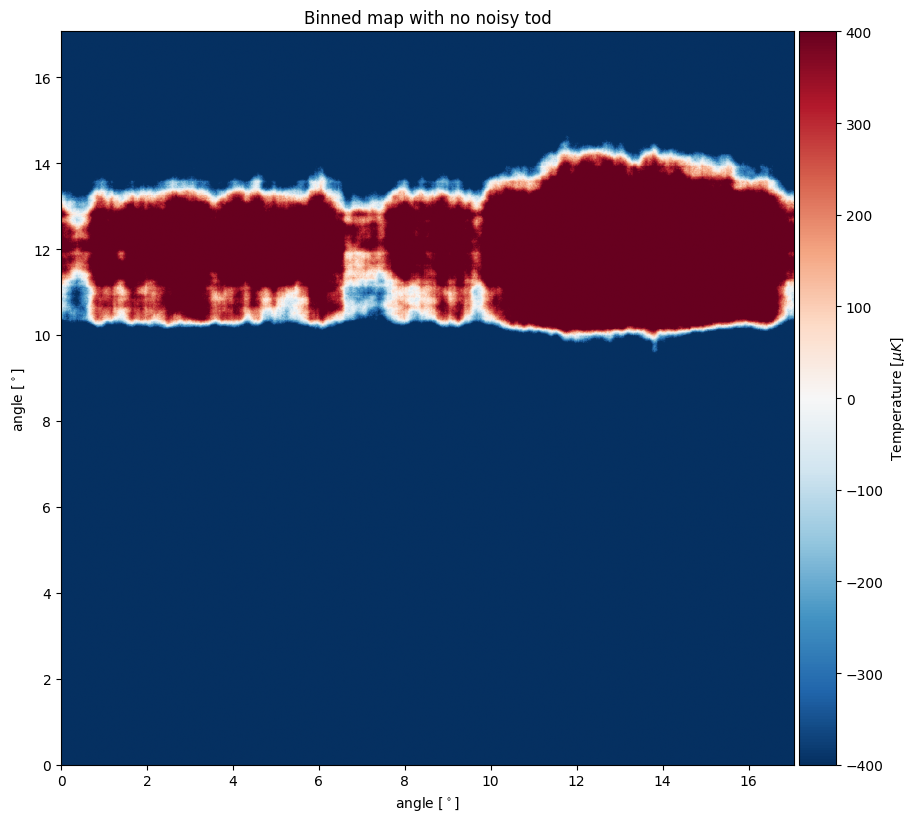

map mean: 2278.154052490309 map rms: 1968.384878627725


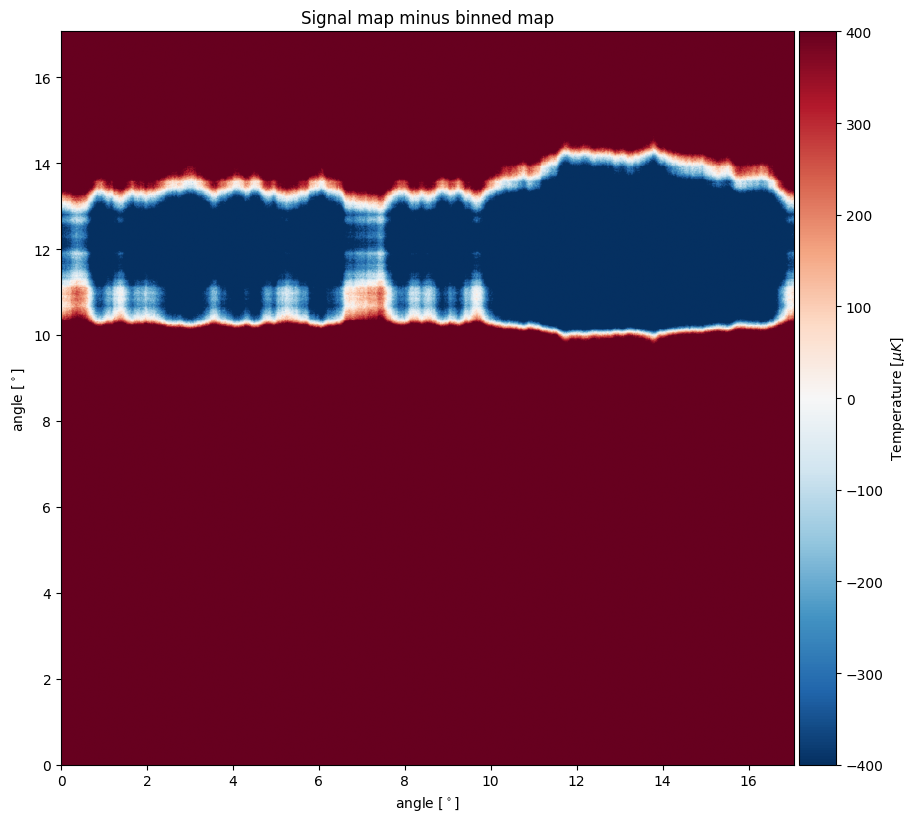

In [207]:
# now we used the binned mapmaking but with noisy time stream

# we use the binned mapmaking
map_binned_noisy = solve_binned_average(noisy_dataset, CMB_T.shape)

plt.title('Binned map with no noisy tod')
Plot_CMB_Map(map_binned_noisy, c_min, c_max, X_width, Y_width, set_lims=1)


plt.title('Signal map minus binned map')
Plot_CMB_Map(CMB_T- map_binned_noisy, c_min, c_max, X_width, Y_width, set_lims=1)

As you can see in the reconstruction with the noisy dataset, the binned mapmaking is not the best option. In this cases (real life), is mandatory to use the $\textbf{maximum likelihood mapmaking}$, which can be implemented as the following:

Solving for map while taking noise correlations into account
iteration:    1 conjugate gradient error:   2.2178075e-02
iteration:    2 conjugate gradient error:   1.6395571e-03
iteration:    3 conjugate gradient error:   2.9884131e-04
iteration:    4 conjugate gradient error:   1.0939886e-04
iteration:    5 conjugate gradient error:   2.9846326e-05
iteration:    6 conjugate gradient error:   1.4131972e-05
iteration:    7 conjugate gradient error:   9.1495465e-06
iteration:    8 conjugate gradient error:   9.0111576e-06
iteration:    9 conjugate gradient error:   1.8392072e-06
iteration:   10 conjugate gradient error:   6.3136356e-07
map mean: 7.494005416219807e-16 map rms: 105.9943471147285


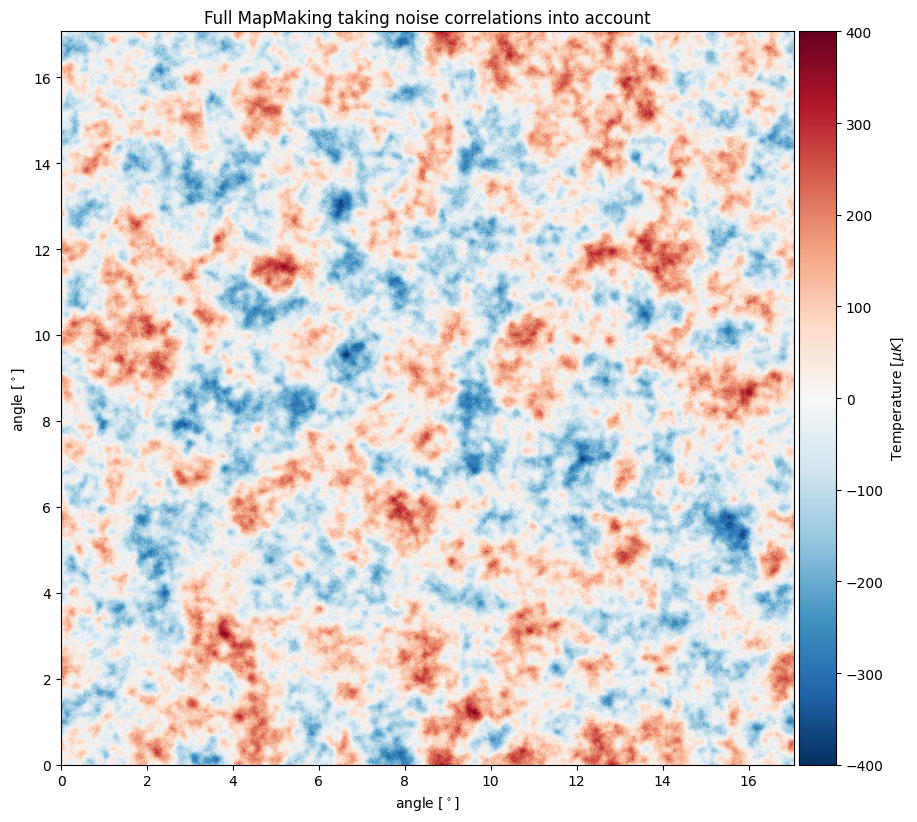

In [210]:
def solve_full(dataset, shape, niter=50, verbose=True):
    """Solve the full map-making equation
    Ax=b, where A = P^t N^-1 P and b = P^t N^-1 d."""
    # Set up our A matrix. We don't compute
    # explicitly because it's too big. Instead,
    # we define it as a function that can be applied
    # to a vector x. We will then use Conjugate Gradients
    # to invert it.
    def A(x): 
        # x is 1d because the conjugate gradient solver works
        # on 1d arrays. So start by expanding it to 2d.
        x   = x.reshape(shape)
        res = x*0
        for data in dataset:
            # simulamos que vería el telescopio si el cielo fuera x
            tod  = Observe_map(x, data.point)
            # aplica el filtro de ruido
            tod  = mul_inv_noise(tod, data.noise_spec)
            # proyectamos de vuelta al mapa
            res += PT(tod, data.point, shape)
        return res.reshape(-1)
    # Build our right-hand side b
    b = np.zeros(shape)
    for data in dataset:
        # se filtran los datos y se proyectan al mapa
        tod = mul_inv_noise(data.tod, data.noise_spec)
        b  += PT(tod, data.point, shape)
    # And solve
    cg = CG(A, b.reshape(-1))
    
    while cg.i < niter:
        cg.step()
        if verbose: print("iteration: %4d conjugate gradient error: %15.7e" % (cg.i, cg.err))
    return cg.x.reshape(shape)


# en el tiempo, el ruido atmosférico es correlacionado, por ello, pasamos a Fourier
# donde el ruido se "desacopla" y aplicamos la división por la potencia espectral 
# del ruido, tal que, suprima las componentes del ruido en frecuencias bajas (es
# como aplicar un filtro de paso alto)

def mul_inv_noise(tod, noise_spec):
    """Multiply by the inverse noise matrix. We assume that the noise
    is stationary, which means that it can be represented by a simple
    power spectrum noise_spec. This function is used to apply inverse
    variance weighting to the data."""
    ftod  = np.fft.fft(tod)
    ftod /= noise_spec
    return np.fft.ifft(ftod).real


def default_M(x):     return np.copy(x)
def default_dot(a,b): return a.dot(np.conj(b))
class CG:
    """A simple Preconditioned Conjugate gradients solver. Solves
    the equation system Ax=b."""
    def __init__(self, A, b, x0=None, M=default_M, dot=default_dot):
        """Initialize a solver for the system Ax=b, with a starting guess of x0 (0
        if not provided). Vectors b and x0 must provide addition and multiplication,
        as well as the .copy() method, such as provided by numpy arrays. The
        preconditioner is given by M. A and M must be functors acting on vectors
        and returning vectors. The dot product may be manually specified using the
        dot argument. This is useful for MPI-parallelization, for example."""
        # Init parameters
        self.A   = A
        self.b   = b
        self.M   = M
        self.dot = dot
        if x0 is None:
            self.x = b*0
            self.r = b
        else:
            self.x   = x0.copy()
            self.r   = b-self.A(self.x)
        # Internal work variables
        n = b.size
        self.z   = self.M(self.r)
        self.rz  = self.dot(self.r, self.z)
        self.rz0 = float(self.rz)
        self.p   = self.z
        self.err = np.inf
        self.d   = 4
        self.arz = []
        self.i   = 0
    def step(self):
        """Take a single step in the iteration. Results in .x, .i
        and .err being updated. To solve the system, call step() in
        a loop until you are satisfied with the accuracy. The result
        can then be read off from .x."""
        Ap = self.A(self.p)
        alpha = self.rz/self.dot(self.p, Ap)
        self.x += alpha*self.p
        self.r -= alpha*Ap
        self.z = self.M(self.r)
        next_rz = self.dot(self.r, self.z)
        self.err = next_rz/self.rz0
        beta = next_rz/self.rz
        self.rz = next_rz
        self.p = self.z + beta*self.p
        self.arz.append(self.rz*alpha)
        self.i += 1


print("Solving for map while taking noise correlations into account")
map_full  = solve_full(noisy_dataset, CMB_T.shape,niter=10)

plt.title("Full MapMaking taking noise correlations into account")
p= Plot_CMB_Map(map_full - np.mean(map_full),c_min,c_max,X_width,Y_width, set_lims=1)

In [ ]:
mapmaker_filter_bin(noisy_dataset[0].tod P_zz, iN_true)

map mean: -1.2568071583451967e-15 map rms: 28.422913376899146


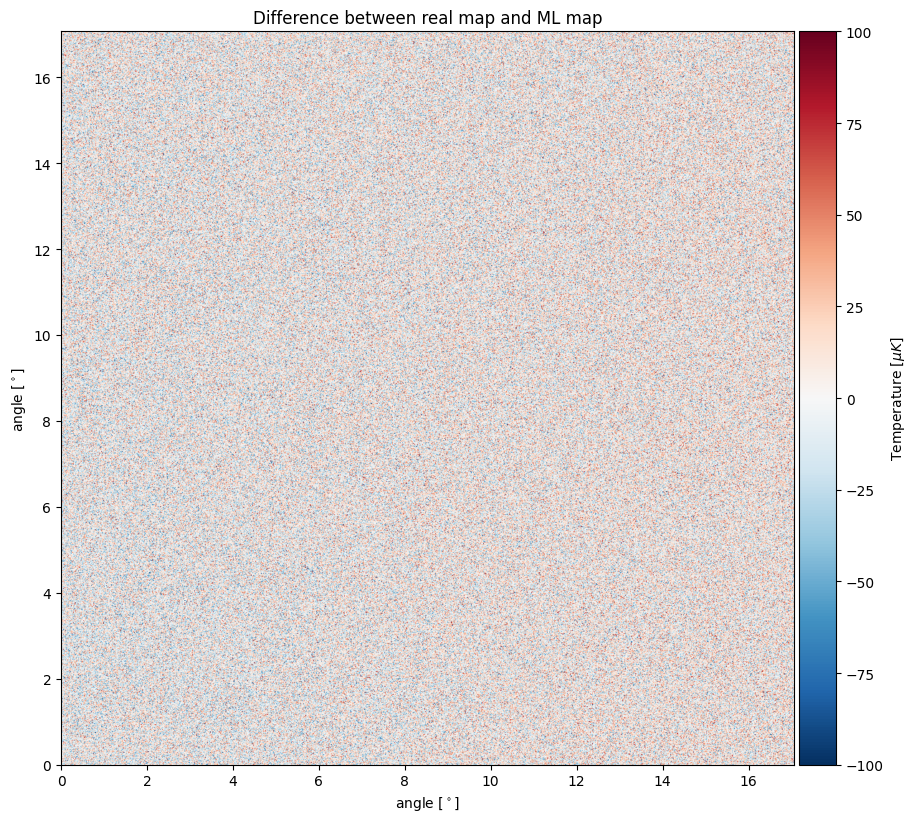

In [211]:
plt.title('Difference between real map and ML map')
Plot_CMB_Map(CMB_T - (map_full - np.mean(map_full)),-100,100,X_width,Y_width, set_lims=1)

## Filter + bin map-making

map mean: 9.769962616701378e-19 map rms: 1.173047046930568


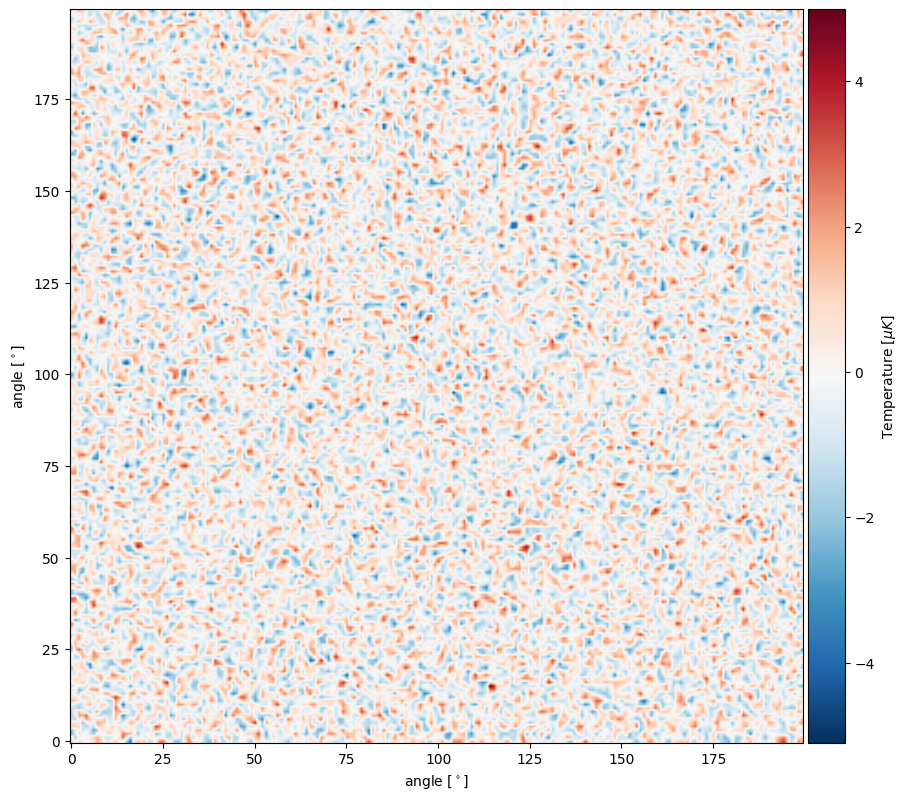

In [165]:
import scipy

s = np.load('/home/mati/Documentos/PhD/códigos/power_loss_sigurd/gain_toy2d_fbin_signal_map.npy')

Plot_CMB_Map(s, c_min=c_min, c_max=c_max, X_width=X_width, Y_width=Y_width, set_lims=0)

## Noise model

In [212]:
import scipy.sparse
import scipy.sparse.linalg


# detectotres
ashape = (2,2)      # 2x2 detectores 
ndet   = ashape[0]*ashape[1] # total detectores
mshape = (200,200)  # (200x200 pixeles)
npix   = mshape[0]*mshape[1] # total píxeles

# scanning strategy Sigurd (sin zigzag)
pix_pat1 = np.mgrid[:mshape[0],:mshape[1]].reshape(2,-1) # pixel en x e y [{y,x},npix]
detoffs  = np.mgrid[:ashape[0],:ashape[1]].reshape(2,-1) # dominio de los detectores (0,0) (1,0) (0,1) (1,1)
pix_pat1 = pix_pat1[:,None,:] + detoffs[:,:,None]  # [{y,x},ndet,npix]

# Wrap around detectors that go off the map
pix_pat1[0] %= mshape[0] 
pix_pat1[1] %= mshape[1]

pix_pat2 = pix_pat1[::-1] # estrategia de escaneo "arriba hacia abajo"
pix   = np.concatenate([pix_pat1,pix_pat2],-1) # esta matriz pix es lo que se obtiene con la función sim_pointing
nsamp = pix.shape[-1]

# scanning strategy zig-zag + cross-linking
lr = sim_pointig(np.zeros((mshape[0], mshape[1])), 0, det=ashape) 
ud = sim_pointig(np.zeros((mshape[0], mshape[1])), 0, det=ashape) 
pix_zz = np.concatenate([lr, ud], -1)

# Pointing Matrix P
y, x = pix.reshape(2,-1)
y_zz, x_zz = pix_zz.reshape(2,-1)
# P tiene dimensiones [ndet*nsamp, npix]
# Build our pointing matrix. This translates from between TOD [ndet*nsamp]
# to flattened pixels [ny*nx], and so has logical shape [ndet*nsamp,ny*nx].
P  = scipy.sparse.csr_array((np.full(ndet*nsamp,1),(np.arange(ndet*nsamp),y*mshape[1]+x)),shape=(ndet*nsamp,npix))
P_zz = scipy.sparse.csr_array((np.full(ndet*nsamp,1),(np.arange(ndet*nsamp),y_zz*mshape[1]+x_zz)),shape=(ndet*nsamp,npix))

# aproximación de cielo plano 
def calc_l(shape):
    ly = np.fft.fftfreq(shape[-2])[:,None]
    lx = np.fft.fftfreq(shape[-1])[None,:]
    l  = (ly**2+lx**2)**0.5
    return l

l      = calc_l(mshape)
lnorm  = 1
C      = (np.maximum(l,l[0,1]/2)/lnorm)**-2 # espectro
bsigma = 3
B      = np.exp(-0.5*l**2*bsigma**2)        # beam gaussiano del instrumento

def sim_signal_map(C, B):
    "mapa de señal con shape mshape, espectri C y beam B"""
    # se convoluciona el espectro con el beam
    signal_map = np.fft.ifft2(np.fft.fft2(np.random.standard_normal(B.shape))*C**0.5*B).real
    return signal_map

# modelado de ruido
freq  = np.fft.rfftfreq(nsamp)

# frecuencia de corte
fknee = 0.5*10/mshape[1] 

# 
    # now we apply our model
    #return freq, (1+(np.maximum(freq,freq[1])/fknee)**-alpha)*sigma**2
iE  = np.clip((np.maximum(freq,freq[1]/2)/fknee)**3.5, 1e-8, 1e8) # modo común 1/f (ver más arriba la fórmula)
iD  = np.ones((ndet,len(freq))) # Ruido blanco


# Build the raw (pre-gain-error) inverse noise matrix.
# Noise will consist a detector-uncorrelated white noise floor
# with stddev 1, and a common-mode 1/f spectrum with stddev of 1 at fknee.
# N  = D + VEV', V = [1 1 1 1 1...]'
# iN = N" = D" - D"V(E" + V'D"V)"V'D" (woodbury)
# diagonal in fourier-direction, correlated in detector-direction. So can
# evaluate this independently per fourier-mode.
# V'D"V = sum(D")

# no se crea explicitamente la matriz N^-1, pero se ocupa para crear un ruido a nivel
# tod con sampleos random y para aplicar el filtro F = N^-1 d
class NmatCommonGainerr:
    def __init__(self, iD, iE):#,gainner:)
        self.iD = iD 
        self.iE = iE 
        #self.gainerr = gainerr if gainerr is not None else np.full(len(iD),1.0)
        self.kernel = 1/(iE + np.sum(iD,0)) # (E" + V'D"V)
    def apply(self, tod): # esto se ocupa para el filter + bin map-making 
        ftod = np.fft.rfft(tod) #/ self.gainerr[:,None]
        # aquí se aplica el WoodBurry iN = N" = D" - D"V(E" + V'D"V)"V'D" 
        ftod = self.iD * ftod - self.iD*self.kernel*np.sum(self.iD*ftod,0)
        tod  = np.fft.irfft(ftod, n=tod.shape[-1])
        #tod /= self.gainerr[:,None]
        return tod
    def sim(self, nsamp):#nogainerr=False
        # simulación del ruido acoplado a nivel tod 
        ndet    = self.iD.shape[0]
        nwhite  = np.fft.irfft(np.fft.rfft(np.random.randn(ndet,nsamp)) * self.iD**-0.5, n=nsamp)
        ncommon = np.fft.irfft(np.fft.rfft(np.random.randn(nsamp)) * self.iE**-0.5,      n=nsamp)
        tod = nwhite + ncommon
        #if not nogainerr:
         #   tod *= self.gainerr[:,None]
        return tod

# clase de inv ruido
iN_true = NmatCommonGainerr(iD, iE)

# mapmakers
def mapmaker_bin(tod, P):
    return scipy.sparse.linalg.spsolve(P.T.dot(P), P.T.dot(tod.reshape(-1))).reshape(mshape)

# Filter + Bin Mapmaking (usando N^-1 como filtro F)
def mapmaker_filter_bin(tod, P, F):
    return scipy.sparse.linalg.spsolve(P.T.dot(P), P.T.dot(F.apply(tod).reshape(-1))).reshape(mshape)

# ML
class CG:
    def __init__(self, A, b):
        self.A = A
        self.b = b
        self.x = np.zeros_like(b)
        self.r = b - A(self.x)
        self.p = self.r.copy()
        self.rsold = np.dot(self.r, self.r)
        self.err = np.sqrt(self.rsold)
    def step(self):
        Ap = self.A(self.p)
        alpha = self.rsold / np.dot(self.p, Ap)
        self.x += alpha * self.p
        self.r -= alpha * Ap
        rsnew = np.dot(self.r, self.r)
        self.err = np.sqrt(rsnew)
        self.p = self.r + (rsnew / self.rsold) * self.p
        self.rsold = rsnew

def mapmaker_ml(tod, P, iN):
    """Resuelve (P^T N^-1 P) m = P^T N^-1 d"""
    b = P.T.dot(iN.apply(tod).reshape(-1))
    def A(x): return P.T.dot(iN.apply(P.dot(x).reshape(tod.shape)).reshape(-1))
    solver = CG(A, b)
    while solver.err > 1e-8: 
        solver.step()
    return solver.x.reshape(mshape)


# realización de señal y ruido
signal_map = sim_signal_map(C, B)
signal_true = P.dot(signal_map.reshape(-1)).reshape(ndet,nsamp)
signal_true_zz = P_zz.dot(signal_map.reshape(-1)).reshape(ndet,nsamp)
noise_true = iN_true.sim(nsamp)

# tod signal + noise
tod_sim = signal_true + noise_true
tod_sim_zz = signal_true_zz + noise_true

# mapas
map_binned = mapmaker_bin(tod_sim, P)
map_fb = mapmaker_filter_bin(tod_sim, P, iN_true)
map_ml = mapmaker_ml(tod_sim, P, iN_true)
map_binned_zz = mapmaker_bin(tod_sim_zz, P_zz)
map_fb_zz = mapmaker_filter_bin(tod_sim_zz, P_zz, iN_true)
map_ml_zz = mapmaker_ml(tod_sim_zz, P_zz, iN_true)


In [160]:
len(tod_sim_zz[0])

80000

In [133]:
map_ml_zz_test = mapmaker_ml(tod_sim_zz, P_zz, NmatCommonGainerr(iD, np.zeros_like(iD)))

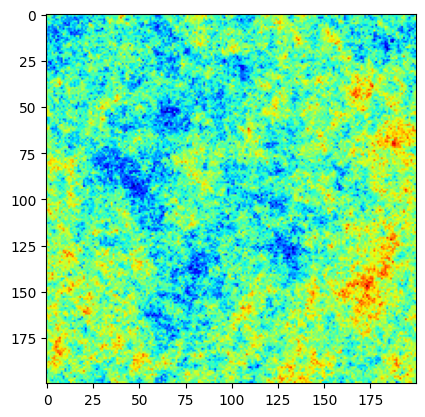

In [137]:
plt.imshow(signal_map-map_ml_zz_test, cmap='jet')



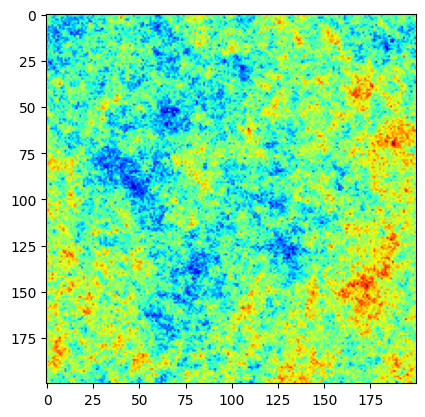

In [136]:
plt.imshow(signal_map-map_ml_zz, cmap='jet')

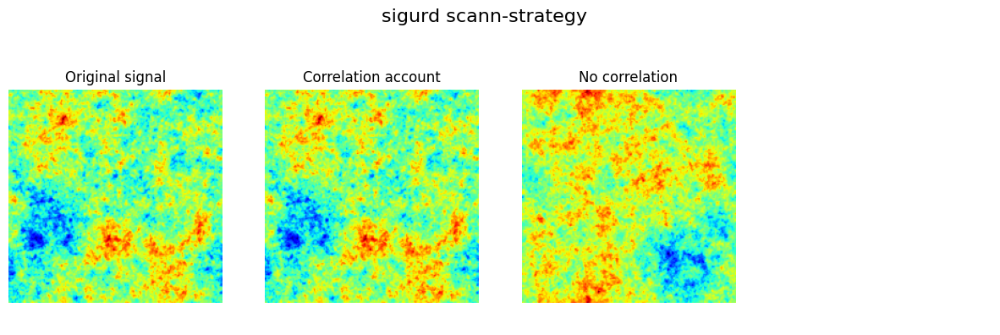

In [144]:
# plots
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
fig.suptitle("sigurd scann-strategy", fontsize=16, y=1.05)
axes[0].imshow(signal_map, cmap='jet'); axes[0].set_title("Original signal")
axes[1].imshow(map_ml_zz, cmap='jet'); axes[1].set_title("Correlation account")
axes[2].imshow(map_ml_zz_test, cmap='jet'); axes[2].set_title("No correlation")
for ax in axes: ax.axis('off')
plt.show()

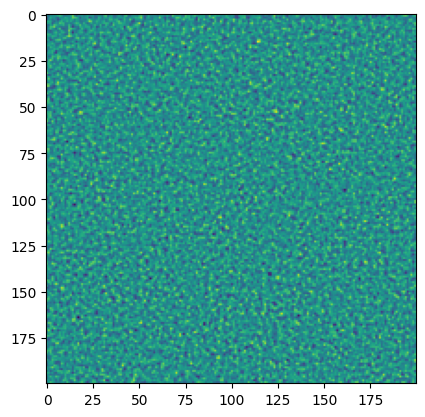

In [167]:
plt.imshow(s)

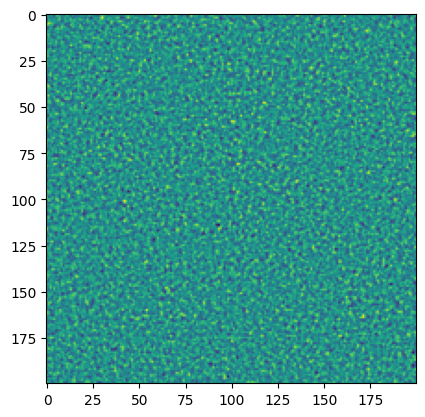

In [168]:
plt.imshow(map_fb)

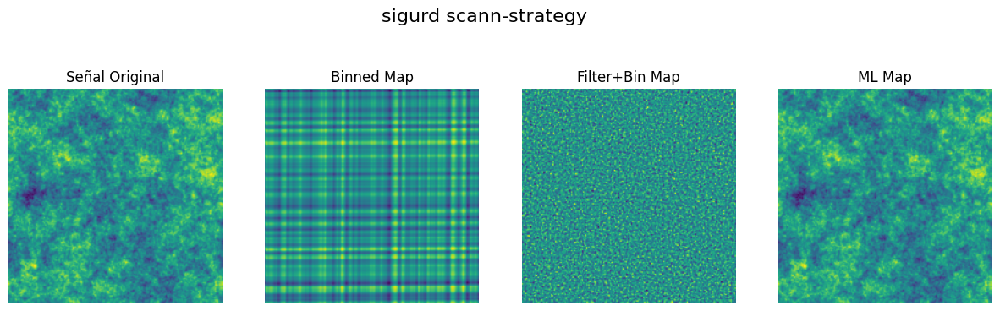

In [ ]:
# plots
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
fig.suptitle("sigurd scann-strategy", fontsize=16, y=1.05)
axes[0].imshow(signal_map); axes[0].set_title("Señal Original")
axes[1].imshow(map_binned); axes[1].set_title("Binned Map")
axes[2].imshow(map_fb); axes[2].set_title("Filter+Bin Map")
axes[3].imshow(map_ml); axes[3].set_title("ML Map")
for ax in axes: ax.axis('off')
plt.show()


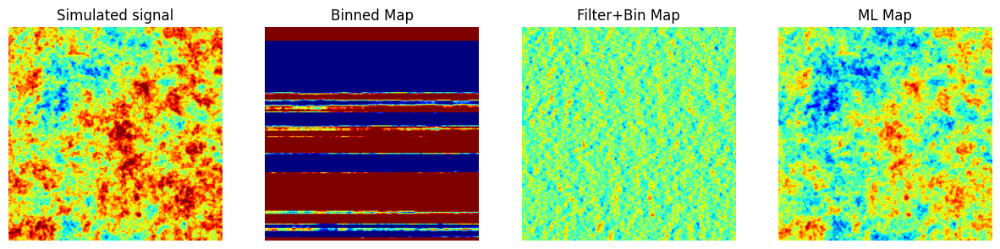

In [213]:
# plots
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
#fig.suptitle("zigzag scann-strategy", fontsize=16, y=1.05)
axes[0].imshow(signal_map, cmap= 'jet', vmin= -16, vmax=16); axes[0].set_title("Simulated signal")
axes[1].imshow(map_binned_zz,  cmap= 'jet', vmin= -16, vmax=16); axes[1].set_title("Binned Map")
axes[2].imshow(map_fb_zz,  cmap= 'jet', vmin= -16, vmax=16); axes[2].set_title("Filter+Bin Map")
axes[3].imshow(map_ml_zz,  cmap= 'jet', ); axes[3].set_title("ML Map")
for ax in axes: ax.axis('off')
#cbar = fig.colorbar(axes[0].imshow(signal_map))
plt.show()

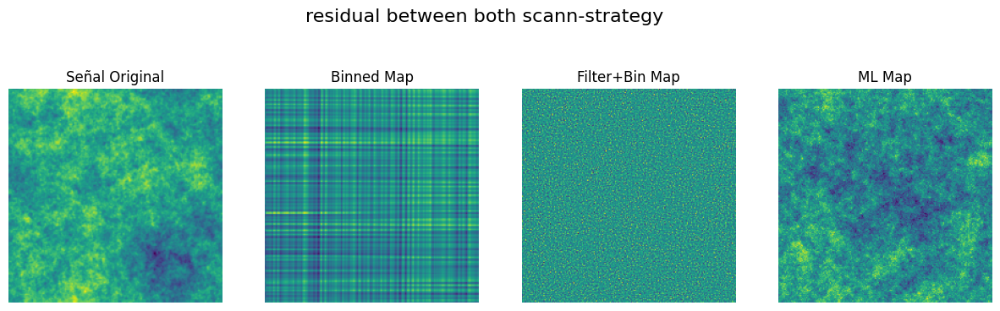

In [141]:
# plots
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
fig.suptitle("residual between both scann-strategy", fontsize=16, y=1.05)
axes[0].imshow(signal_map); axes[0].set_title("Señal Original")
axes[1].imshow( map_binned_zz - map_binned); axes[1].set_title("Binned Map")
axes[2].imshow(map_fb - map_fb_zz); axes[2].set_title("Filter+Bin Map")
axes[3].imshow(map_ml - map_ml_zz); axes[3].set_title("ML Map")
for ax in axes: ax.axis('off')

plt.show()

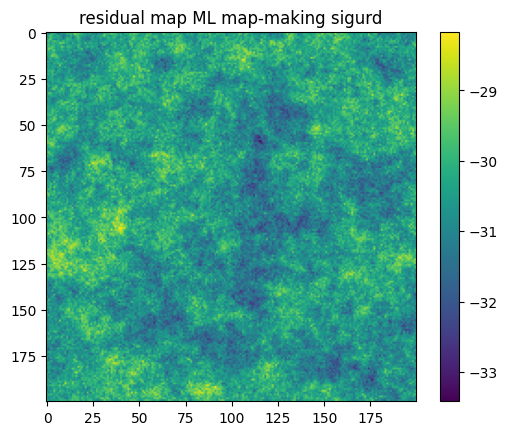

In [80]:
plt.imshow(signal_map- map_ml)
plt.title('residual map ML map-making sigurd' )
plt.colorbar()


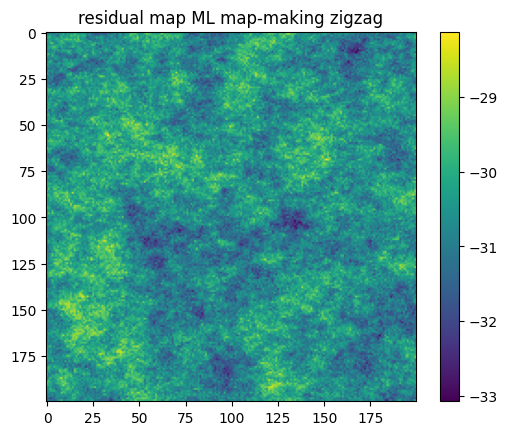

In [81]:
plt.imshow(signal_map- map_ml_zz)
plt.title('residual map ML map-making zigzag' )
plt.colorbar()

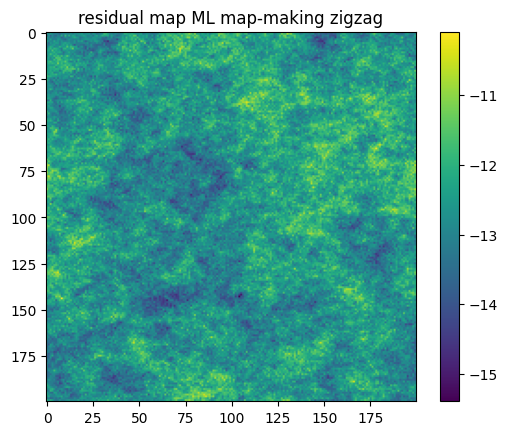

In [ ]:
plt.imshow(signal_map - map_ml_zz)
plt.title('residual map ML map-making zigzag')
plt.colorbar()

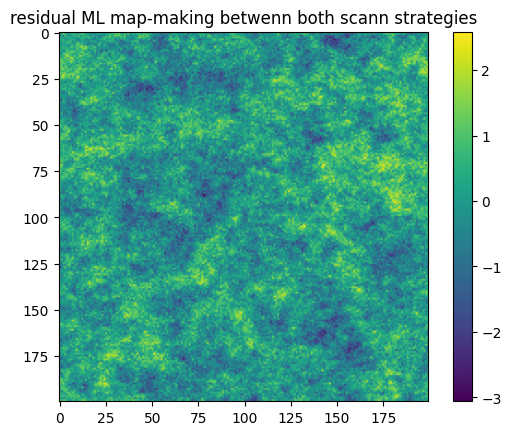

In [ ]:
plt.imshow(map_ml - map_ml_zz)
plt.title('residual ML map-making betwenn both scann strategies')
plt.colorbar()

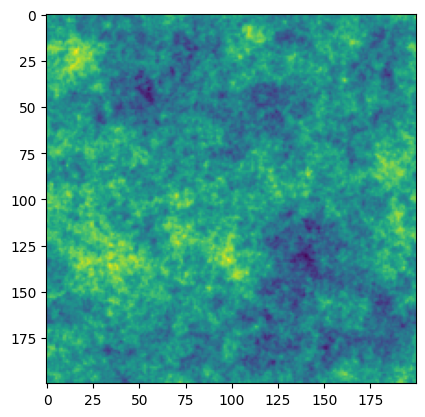

In [ ]:
plt.imshow(map_ml)

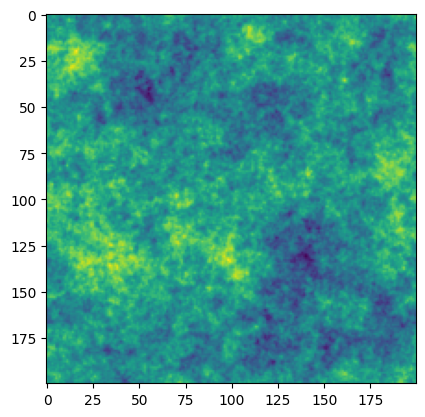

In [ ]:
plt.imshow(map_ml_zz)

In [82]:
# detectotres
ashape = (2,2)      # 2x2 detectores 
ndet   = ashape[0]*ashape[1] # total detectores
mshape = (200,200)  # (200x200 pixeles)
npix   = mshape[0]*mshape[1] # total píxeles


In [ ]:
pix_pat_zz

array([[[  0,   0,   0, ..., 199, 199, 199],
        [  0,   0,   0, ..., 199, 199, 199],
        [  1,   1,   1, ...,   0,   0,   0],
        [  1,   1,   1, ...,   0,   0,   0]],

       [[  0,   1,   2, ...,   2,   1,   0],
        [  1,   2,   3, ...,   3,   2,   1],
        [  0,   1,   2, ...,   2,   1,   0],
        [  1,   2,   3, ...,   3,   2,   1]]], shape=(2, 4, 80000))

In [83]:
sim_pointig(np.zeros((mshape[0], mshape[1])), 0, det=ashape) 

array([[[  0,   0,   0, ..., 199, 199, 199],
        [  0,   0,   0, ..., 199, 199, 199],
        [  1,   1,   1, ...,   0,   0,   0],
        [  1,   1,   1, ...,   0,   0,   0]],

       [[  0,   1,   2, ...,   2,   1,   0],
        [  1,   2,   3, ...,   3,   2,   1],
        [  0,   1,   2, ...,   2,   1,   0],
        [  1,   2,   3, ...,   3,   2,   1]]], shape=(2, 4, 40000))

In [ ]:
np.zeros((200,200))

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(200, 200))

In [ ]:
np.mgrid[:mshape[0],:mshape[1]].reshape(2,-1)[0]

array([  0,   0,   0, ..., 199, 199, 199], shape=(40000,))

In [84]:
np.mgrid[:mshape[0],:mshape[1]].reshape(2,-1)[:, None, :] +  detoffs[:,:,None]






array([[[  0,   0,   0, ..., 199, 199, 199],
        [  0,   0,   0, ..., 199, 199, 199],
        [  1,   1,   1, ..., 200, 200, 200],
        [  1,   1,   1, ..., 200, 200, 200]],

       [[  0,   1,   2, ..., 197, 198, 199],
        [  1,   2,   3, ..., 198, 199, 200],
        [  0,   1,   2, ..., 197, 198, 199],
        [  1,   2,   3, ..., 198, 199, 200]]], shape=(2, 4, 40000))

In [ ]:
detoffs

array([[0, 0, 1, 1],
       [0, 1, 0, 1]])

In [ ]:
iD

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], shape=(4, 40001))

In [ ]:
np.shape(P)

(320000, 40000)

In [ ]:
200*200*2


80000

In [ ]:
nsamp

80000

In [ ]:
pix[:, 0, :]

array([[  0,   0,   0, ..., 197, 198, 199],
       [  0,   1,   2, ..., 199, 199, 199]], shape=(2, 80000))

In [ ]:
(200**2)*4

160000

In [ ]:
iN_true

In [85]:
pix_pat1 = np.mgrid[:mshape[0],:mshape[1]].reshape(2,-1)

In [ ]:
np.mgrid[:mshape[0],:mshape[1]].reshape(2,-1)[0]

array([  0,   0,   0, ..., 199, 199, 199], shape=(40000,))

In [ ]:
pix_pat1

array([[  0,   0,   0, ..., 199, 199, 199],
       [  0,   1,   2, ..., 197, 198, 199]], shape=(2, 40000))

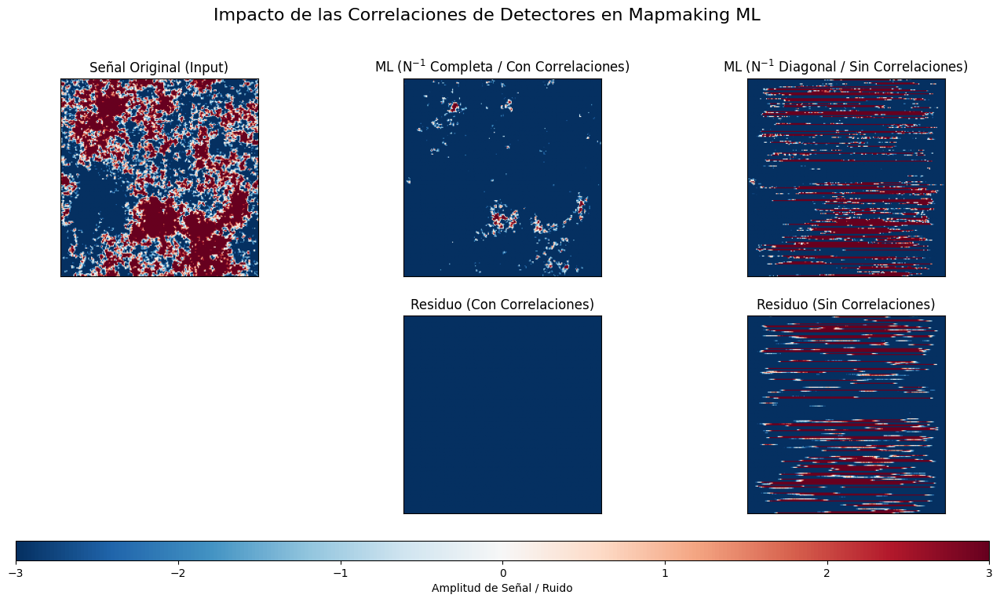

In [145]:
import matplotlib.pyplot as plt

# 1. Definir el operador N^-1 sin correlaciones cruzadas (Diagonal)
class NmatUncorrelated:
    def __init__(self, iD, iE):
        # Asumimos que el ruido auto-espectral es N_ii = D_ii + E
        # Como tenemos las inversas iD = 1/D y iE = 1/E, calculamos el auto-espectro inverso:
        self.iN_auto = 1.0 / (1.0/iD + 1.0/iE)
        
    def apply(self, tod):
        # Aplica un filtro pasa-altos independiente por detector
        ftod = np.fft.rfft(tod)
        ftod = self.iN_auto * ftod
        return np.fft.irfft(ftod, n=tod.shape[-1])

# Instanciar el ruido incorrelacionado
iN_nocorr = NmatUncorrelated(iD, iE)

# 2. Calcular el mapa ML asumiendo ruido incorrelacionado
# Utilizamos la estrategia zig-zag (zz) porque el cross-linking es crucial 
# para que el ML real recupere las grandes escalas.
map_ml_nocorr_zz = mapmaker_ml(tod_sim_zz, P_zz, iN_nocorr)

# 3. Generar el Plot Comparativo
fig, axes = plt.subplots(2, 3, figsize=(16, 9))

# Definimos límites de color simétricos para apreciar bien las escalas y residuos
vmin, vmax = -3, 3 

# --- Fila 1: Mapas Recuperados ---
axes[0, 0].imshow(signal_map, vmin=vmin, vmax=vmax, cmap='RdBu_r')
axes[0, 0].set_title("Señal Original (Input)")

axes[0, 1].imshow(map_ml_zz, vmin=vmin, vmax=vmax, cmap='RdBu_r')
axes[0, 1].set_title("ML (N$^{-1}$ Completa / Con Correlaciones)")

axes[0, 2].imshow(map_ml_nocorr_zz, vmin=vmin, vmax=vmax, cmap='RdBu_r')
axes[0, 2].set_title("ML (N$^{-1}$ Diagonal / Sin Correlaciones)")

# --- Fila 2: Residuos (Mapa Recuperado - Señal Input) ---
axes[1, 0].axis('off') # Dejamos el primer panel vacío para centrar la atención

im1 = axes[1, 1].imshow(map_ml_zz - signal_map, vmin=vmin, vmax=vmax, cmap='RdBu_r')
axes[1, 1].set_title("Residuo (Con Correlaciones)")

im2 = axes[1, 2].imshow(map_ml_nocorr_zz - signal_map, vmin=vmin, vmax=vmax, cmap='RdBu_r')
axes[1, 2].set_title("Residuo (Sin Correlaciones)")

# Formato visual
for ax in axes.flatten():
    if ax.has_data():
        ax.set_xticks([])
        ax.set_yticks([])

# Barra de color global
cbar = fig.colorbar(im1, ax=axes.ravel().tolist(), orientation='horizontal', aspect=50, pad=0.05)
cbar.set_label(r'Amplitud de Señal / Ruido')

plt.suptitle("Impacto de las Correlaciones de Detectores en Mapmaking ML", fontsize=16)
plt.show()

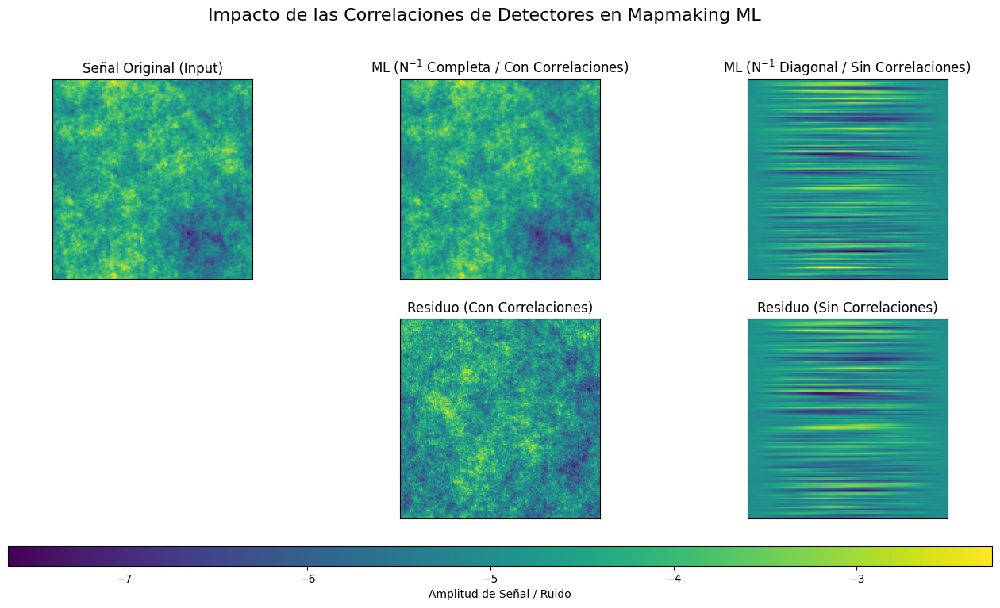

In [140]:
# 3. Generar el Plot Comparativo
fig, axes = plt.subplots(2, 3, figsize=(16, 9))

# Definimos límites de color simétricos para apreciar bien las escalas y residuos
vmin, vmax = -3, 3 

# --- Fila 1: Mapas Recuperados ---
axes[0, 0].imshow(signal_map, )
axes[0, 0].set_title("Señal Original (Input)")

axes[0, 1].imshow(map_ml_zz,)
axes[0, 1].set_title("ML (N$^{-1}$ Completa / Con Correlaciones)")

axes[0, 2].imshow(map_ml_nocorr_zz,)
axes[0, 2].set_title("ML (N$^{-1}$ Diagonal / Sin Correlaciones)")

# --- Fila 2: Residuos (Mapa Recuperado - Señal Input) ---
axes[1, 0].axis('off') # Dejamos el primer panel vacío para centrar la atención

im1 = axes[1, 1].imshow(map_ml_zz - signal_map, )
axes[1, 1].set_title("Residuo (Con Correlaciones)")

im2 = axes[1, 2].imshow(map_ml_nocorr_zz - signal_map,  )
axes[1, 2].set_title("Residuo (Sin Correlaciones)")

# Formato visual
for ax in axes.flatten():
    if ax.has_data():
        ax.set_xticks([])
        ax.set_yticks([])

# Barra de color global
cbar = fig.colorbar(im1, ax=axes.ravel().tolist(), orientation='horizontal', aspect=50, pad=0.05)
cbar.set_label(r'Amplitud de Señal / Ruido')

plt.suptitle("Impacto de las Correlaciones de Detectores en Mapmaking ML", fontsize=16)
plt.show()

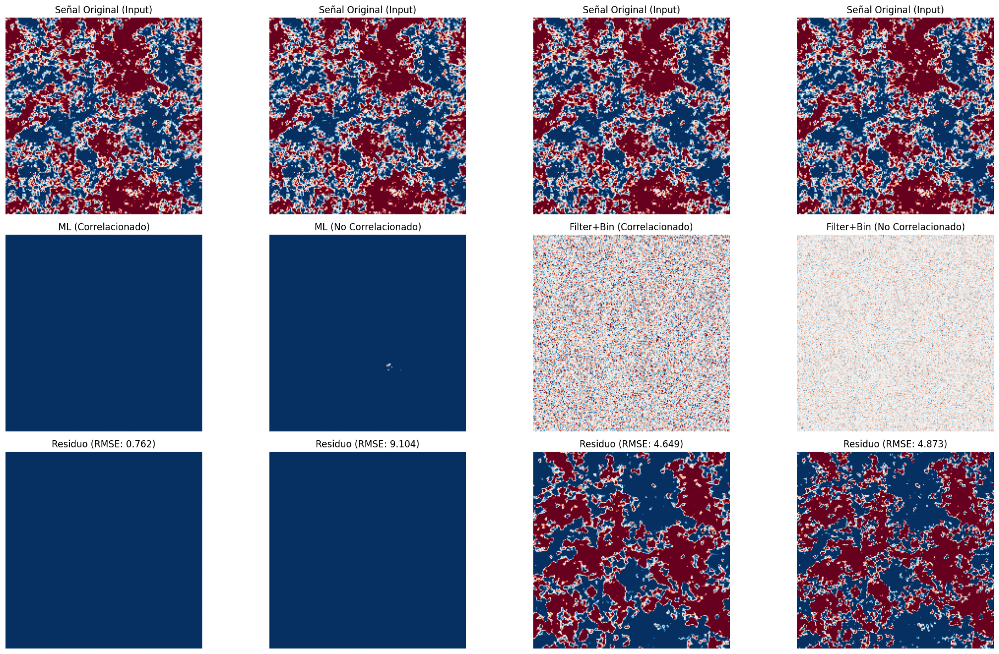

In [147]:
import numpy as np
import scipy.sparse
import scipy.sparse.linalg
import matplotlib.pyplot as plt

# ==========================================
# 1. Parámetros e Inicialización
# ==========================================
ashape = (2,2)      # 2x2 detectores
ndet   = ashape[0] * ashape[1]
mshape = (200,200)  # Mapa de 200x200 píxeles
npix   = mshape[0] * mshape[1]

# Estrategia de escaneo zig-zag con cross-linking
def sim_pointing(shape, det_shape):
    ny, nx = shape
    dy, dx = det_shape
    X, Y = np.meshgrid(np.arange(nx), np.arange(ny))
    
    # Escaneo horizontal y vertical para asegurar cross-linking
    lr_pix = np.array([Y.flatten(), X.flatten()])[:, None, :] + np.mgrid[:dy, :dx].reshape(2, -1)[:, :, None]
    ud_pix = np.array([Y.T.flatten(), X.T.flatten()])[:, None, :] + np.mgrid[:dy, :dx].reshape(2, -1)[:, :, None]
    
    lr_pix[0] %= ny; lr_pix[1] %= nx
    ud_pix[0] %= ny; ud_pix[1] %= nx
    return np.concatenate([lr_pix, ud_pix], axis=-1)

pix_zz = sim_pointing(mshape, ashape)
nsamp = pix_zz.shape[-1]
y_zz, x_zz = pix_zz.reshape(2,-1)

# Matriz de apuntamiento P
P = scipy.sparse.csr_array(
    (np.full(ndet*nsamp, 1), (np.arange(ndet*nsamp), y_zz*mshape[1] + x_zz)),
    shape=(ndet*nsamp, npix)
)

# ==========================================
# 2. Generación de Señal CMB
# ==========================================
def calc_l(shape):
    ly = np.fft.fftfreq(shape[-2])[:,None]
    lx = np.fft.fftfreq(shape[-1])[None,:]
    return (ly**2 + lx**2)**0.5

l = calc_l(mshape)
C = (np.maximum(l, l[0,1]/2))**-2 # Espectro de potencia simple
B = np.exp(-0.5 * l**2 * 3**2)    # Beam gaussiano

signal_map = np.fft.ifft2(np.fft.fft2(np.random.standard_normal(B.shape)) * C**0.5 * B).real
signal_tod = P.dot(signal_map.reshape(-1)).reshape(ndet, nsamp)

# ==========================================
# 3. Modelos de Ruido (Correlacionado vs No Correlacionado)
# ==========================================
freq  = np.fft.rfftfreq(nsamp)
fknee = 0.5 * 100 / mshape[1]
iE    = np.clip((np.maximum(freq, freq[1]/2) / fknee)**3.5, 1e-8, 1e8) # Inverso del modo común
iD    = np.ones((ndet, len(freq)))                                     # Inverso del ruido blanco

class NmatCorrelated:
    """Modelo con correlación entre detectores (Similar a NmatDetvecs)"""
    def __init__(self, iD, iE):
        self.iD = iD
        self.iE = iE
        self.kernel = 1 / (iE + np.sum(iD, axis=0)) # Identidad de Woodbury
        
    def apply(self, tod):
        ftod = np.fft.rfft(tod)
        ftod = self.iD * ftod - self.iD * self.kernel * np.sum(self.iD * ftod, axis=0)
        return np.fft.irfft(ftod, n=tod.shape[-1])
        
    def sim_noise(self, nsamp):
        nwhite  = np.fft.irfft(np.fft.rfft(np.random.randn(ndet, nsamp)) * self.iD**-0.5, n=nsamp)
        ncommon = np.fft.irfft(np.fft.rfft(np.random.randn(nsamp)) * self.iE**-0.5, n=nsamp)
        return nwhite + ncommon # Ruido acoplado físicamente

class NmatUncorrelated:
    """Modelo diagonal, asume detectores independientes (Similar a NmatUncorr)"""
    def __init__(self, iD, iE):
        self.iN_auto = 1.0 / (1.0/iD + 1.0/iE) # Solo auto-espectro
        
    def apply(self, tod):
        ftod = np.fft.rfft(tod)
        ftod = self.iN_auto * ftod
        return np.fft.irfft(ftod, n=tod.shape[-1])

# Instanciar modelos y simular TOD final (usamos el ruido correlacionado como el "verdadero" del instrumento)
iN_corr   = NmatCorrelated(iD, iE)
iN_uncorr = NmatUncorrelated(iD, iE)

noise_tod = iN_corr.sim_noise(nsamp)
tod_sim   = signal_tod + noise_tod

# ==========================================
# 4. Mapmakers
# ==========================================
def mapmaker_filter_bin(tod, P, iN):
    """m = (diag(P^T P))^-1 P^T N^-1 d"""
    tod_filtered = iN.apply(tod).reshape(-1)
    rhs = P.T.dot(tod_filtered)
    hits = P.T.dot(np.ones(P.shape[0]))
    hits[hits == 0] = 1 
    return (rhs / hits).reshape(mshape)

class CG:
    def __init__(self, A, b):
        self.A, self.b = A, b
        self.x = np.zeros_like(b)
        self.r = b - A(self.x)
        self.p = self.r.copy()
        self.rsold = np.dot(self.r, self.r)
        self.err = np.sqrt(self.rsold)
    def step(self):
        Ap = self.A(self.p)
        alpha = self.rsold / np.dot(self.p, Ap)
        self.x += alpha * self.p
        self.r -= alpha * Ap
        rsnew = np.dot(self.r, self.r)
        self.err = np.sqrt(rsnew)
        self.p = self.r + (rsnew / self.rsold) * self.p
        self.rsold = rsnew

def mapmaker_ml(tod, P, iN):
    """Resuelve (P^T N^-1 P) m = P^T N^-1 d"""
    b = P.T.dot(iN.apply(tod).reshape(-1))
    def A(x): return P.T.dot(iN.apply(P.dot(x).reshape(tod.shape)).reshape(-1))
    
    solver = CG(A, b)
    while solver.err > 1e-6: # Tolerancia
        solver.step()
    return solver.x.reshape(mshape)

# ==========================================
# 5. Ejecución del Pipeline y Cálculo de Residuos
# ==========================================
# Generar mapas
map_fb_corr   = mapmaker_filter_bin(tod_sim, P, iN_corr)
map_fb_uncorr = mapmaker_filter_bin(tod_sim, P, iN_uncorr)

map_ml_corr   = mapmaker_ml(tod_sim, P, iN_corr)
map_ml_uncorr = mapmaker_ml(tod_sim, P, iN_uncorr)

# Calcular mapas residuales (Mapa reconstruido - Señal original)
res_fb_corr   = map_fb_corr - signal_map
res_fb_uncorr = map_fb_uncorr - signal_map

res_ml_corr   = map_ml_corr - signal_map
res_ml_uncorr = map_ml_uncorr - signal_map

# ==========================================
# 6. Visualización
# ==========================================
fig, axes = plt.subplots(3, 4, figsize=(20, 12))
vmin, vmax = -3, 3
rvmin, rvmax = -1.5, 1.5

# Diccionarios para iterar más fácil
mapas = [map_ml_corr, map_ml_uncorr, map_fb_corr, map_fb_uncorr]
residuos = [res_ml_corr, res_ml_uncorr, res_fb_corr, res_fb_uncorr]
titulos = [
    "ML (Correlacionado)", "ML (No Correlacionado)", 
    "Filter+Bin (Correlacionado)", "Filter+Bin (No Correlacionado)"
]

# Fila 1: Señal Original
for ax in axes[0]:
    ax.imshow(signal_map, vmin=vmin, vmax=vmax, cmap='RdBu_r')
    ax.set_title("Señal Original (Input)")
    ax.axis('off')

# Fila 2: Mapas Reconstruidos
for i in range(4):
    im = axes[1, i].imshow(mapas[i], vmin=vmin, vmax=vmax, cmap='RdBu_r')
    axes[1, i].set_title(titulos[i])
    axes[1, i].axis('off')

# Fila 3: Mapas Residuales
for i in range(4):
    im_res = axes[2, i].imshow(residuos[i], vmin=rvmin, vmax=rvmax, cmap='RdBu_r')
    axes[2, i].set_title(f"Residuo (RMSE: {np.std(residuos[i]):.3f})")
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()

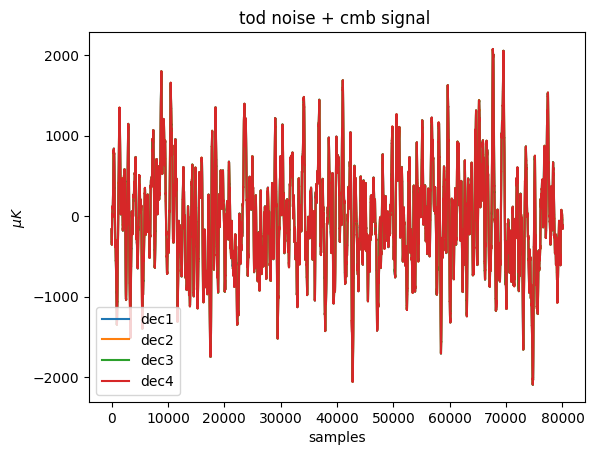

In [148]:
plt.plot(tod_sim[0, :], label= 'dec1')
plt.plot(tod_sim[1, :],  label= 'dec2')
plt.plot(tod_sim[2, :],  label= 'dec3')
plt.plot(tod_sim[3, :],  label= 'dec4')

plt.title('tod noise + cmb signal ')
plt.ylabel(r'$\mu K$')
plt.xlabel('samples')
plt.legend()

In [87]:
# spectrum and average

p1 = np.abs(np.fft.rfft(tod_sim[0, :]))**2
p2 = np.abs(np.fft.rfft(tod_sim[1, :]))**2
p3 = np.abs(np.fft.rfft(tod_sim[2, :]))**2
p4 = np.abs(np.fft.rfft(tod_sim[3, :]))**2

avg = (p1+p2+p3+p4)/4

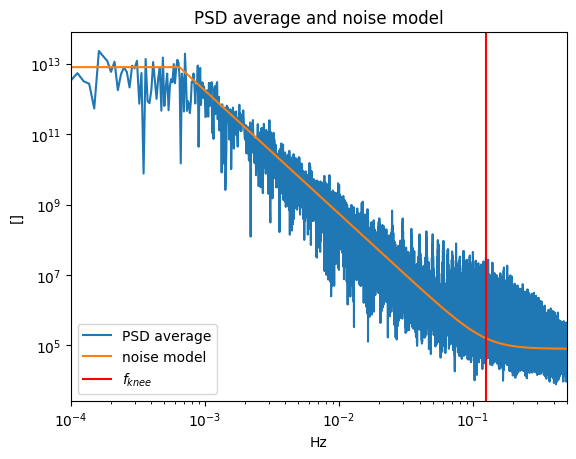

In [88]:
plt.loglog(freq, avg, label= 'PSD average')
plt.loglog(freq, nsamp*(1/iE+1/np.mean(iD)), label = 'noise model')
plt.axvline(fknee, color = 'red', label=r'$f_{knee}$')
plt.xlim(1e-4, 0.5)
plt.title('PSD average and noise model')
plt.ylabel('[]')
plt.xlabel(r'Hz')
plt.legend()


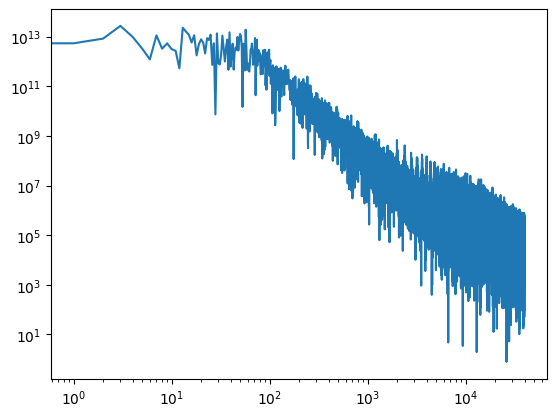

In [89]:
plt.loglog(np.abs(np.fft.rfft(tod_sim[0, :]))**2, label= 'dec1')
#plt.plot(np.abs(np.fft.rfft(tod_sim[1, :]))**2, label= 'dec1')
#plt.plot(np.abs(np.fft.rfft(tod_sim[2, :]))**2, label= 'dec1')
#plt.plot(np.abs(np.fft.rfft(tod_sim[3, :]))**2, label= 'dec1')

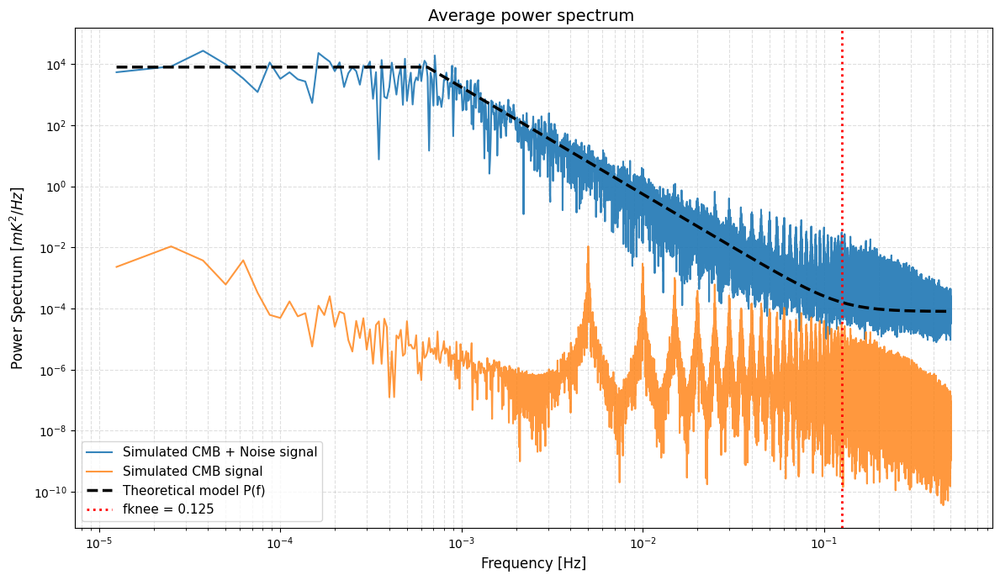

In [112]:
import matplotlib.pyplot as plt

# 1. Calcular el espectro de potencia empírico del TOD simulado
# Aplicamos la transformada de Fourier sobre el eje del tiempo (axis=1)
ftod_sim = np.fft.rfft(tod_sim, axis=1)
# Calculamos la potencia (|FT|^2) y promediamos sobre todos los detectores (axis=0)
psd_tod_empirico = np.mean(np.abs(ftod_sim)**2, axis=0)

# (Opcional pero recomendado) Calcular el espectro solo de la señal y solo del ruido
psd_signal_empirico = np.mean(np.abs(np.fft.rfft(signal_true, axis=1))**2, axis=0)
psd_noise_empirico = np.mean(np.abs(np.fft.rfft(noise_true, axis=1))**2, axis=0)

# 2. Calcular el modelo teórico del ruido
# La varianza teórica es D^-1 (blanco) + E^-1 (común). 
# Multiplicamos por 'nsamp' por la convención de normalización de np.fft.rfft
iD_mean = np.mean(iD, axis=0) # Promedio del inverso de la varianza del ruido blanco
psd_ruido_teorico = nsamp * ((1.0 / iD_mean) + (1.0 / iE))

# 3. Graficar los resultados
plt.figure(figsize=(12, 7))

# Graficamos a partir del índice 1 para ignorar la frecuencia 0 (componente continua) en escala log-log
plt.loglog(freq[1:], psd_tod_empirico[1:]/1000000000, label='Simulated CMB + Noise signal', alpha=0.9, color='tab:blue')
#plt.loglog(freq[1:], psd_noise_empirico[1:], label='Ruido Simulado (Empírico)', alpha=0.5, color='tab:cyan')
plt.loglog(freq[1:], psd_signal_empirico[1:]/10**12, label='Simulated CMB signal ', alpha=0.8, color='tab:orange')

# Línea del modelo teórico
plt.loglog(freq[1:], psd_ruido_teorico[1:]/1000000000, label='Theoretical model P(f)', 
           linewidth=2.5, color='black', linestyle='--')

# Marcar la frecuencia de corte (fknee)
plt.axvline(fknee, color='red', linestyle=':', linewidth=2, label=f'fknee = {fknee:.3f}')

# Configuración del gráfico
plt.xlabel('Frequency [Hz]', fontsize=12)
plt.ylabel(r'Power Spectrum $[mK^2/Hz]$', fontsize=12)
plt.title('Average power spectrum ', fontsize=14)
plt.legend(fontsize=11)
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

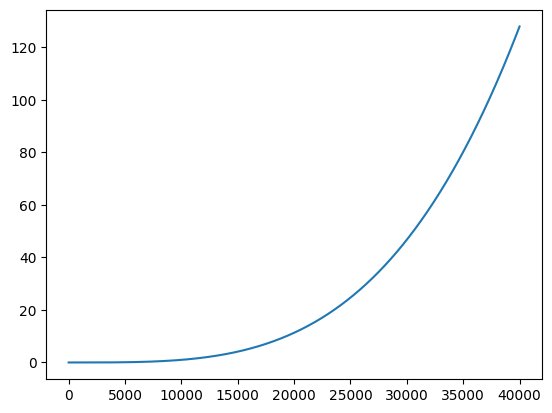

In [ ]:
plt.plot(iE)

In [ ]:
freq_filter, noise_filter = sim_noise_spec(nsamp, dt=1.25e-05, fknee=fknee, alpha=3.5, sigma=1)

In [ ]:
freq[1]-freq[0]

np.float64(1.25e-05)

In [ ]:
iW

NameError: name 'iW' is not defined

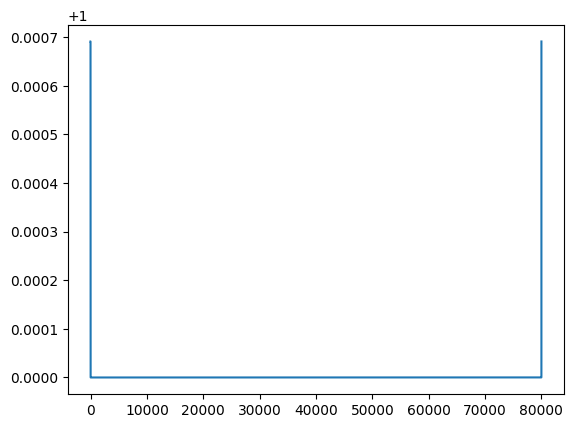

In [ ]:
plt.plot(np.clip(noise_filter, 1e-8, 1e8))

In [ ]:
freq

array([0.000000e+00, 1.250000e-05, 2.500000e-05, ..., 4.999750e-01,
       4.999875e-01, 5.000000e-01], shape=(40001,))

In [ ]:
freq_lr

array([0.        , 0.00022925, 0.0004585 , ..., 0.00068775, 0.0004585 ,
       0.00022925], shape=(1048576,))

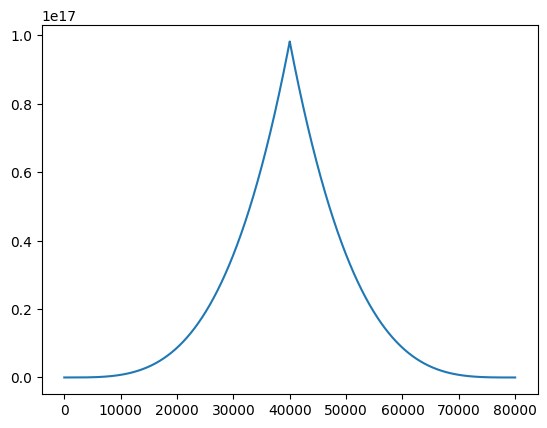

In [ ]:
plt.plot(iE)